# Uncertainty analysis - Pancreas

In [1]:
%load_ext autoreload
%autoreload 2

In [2]:
import os
import sys

import cellrank as cr
import mplscience
import torch
from velovi import VELOVI

import numpy as np
import pandas as pd
from scipy.stats import ttest_ind
from sklearn.preprocessing import MinMaxScaler

import matplotlib.pyplot as plt
import seaborn as sns

import scanpy as sc
import scvelo as scv
from scvelo.core import l2_norm
from scvelo.inference import fit_velovi
from scvelo.inference._model import _compute_directional_statistics_tensor
from scvelo.preprocessing.neighbors import get_neighs
from scvelo.tools.utils import get_indices

sys.path.append("../..")
from paths import FIG_DIR, PROJECT_DIR  # isort: skip  # noqa: E402

/vol/storage/miniconda3/envs/conda_env_robin/lib/python3.9/site-packages/scvi/_settings.py:63: UserWarning: Since v1.0.0, scvi-tools no longer uses a random seed by default. Run `scvi.settings.seed = 0` to reproduce results from previous versions.
  self.seed = seed
/vol/storage/miniconda3/envs/conda_env_robin/lib/python3.9/site-packages/scvi/_settings.py:70: UserWarning: Setting `dl_pin_memory_gpu_training` is deprecated in v1.0 and will be removed in v1.1. Please pass in `pin_memory` to the data loaders instead.
  self.dl_pin_memory_gpu_training = (
/vol/storage/miniconda3/envs/conda_env_robin/lib/python3.9/site-packages/umap/distances.py:1063: NumbaDeprecationWarning: The 'nopython' keyword argument was not supplied to the 'numba.jit' decorator. The implicit default value for this argument is currently False, but it will be changed to True in Numba 0.59.0. See https://numba.readthedocs.io/en/stable/reference/deprecation.html#deprecation-of-object-mode-fall-back-behaviour-when-using-

## Function definitions

In [4]:
def fit_velovi_(bdata):
    """Training function for original veloVI model for scRNA or snRNA data.

    Parameters
    ----------
    bdata
        Annotated data
    """
    VELOVI.setup_anndata(bdata, spliced_layer="Ms", unspliced_layer="Mu")

    vae = VELOVI(bdata)
    vae.train(max_epochs=500)

    latent_time = vae.get_latent_time(n_samples=25)
    velocities = vae.get_velocity(n_samples=25, velo_statistic="mean")

    t = latent_time
    scaling = 20 / t.max(0)

    bdata.layers["velocities_velovi"] = velocities / scaling
    bdata.layers["latent_time_velovi"] = latent_time

    bdata.var["fit_alpha"] = vae.get_rates()["alpha"] / scaling
    bdata.var["fit_beta"] = vae.get_rates()["beta"] / scaling
    bdata.var["fit_gamma"] = vae.get_rates()["gamma"] / scaling
    bdata.var["fit_t_"] = (
        torch.nn.functional.softplus(vae.module.switch_time_unconstr).detach().cpu().numpy()
    ) * scaling
    bdata.layers["fit_t"] = latent_time.values * np.expand_dims(scaling, axis=0)
    bdata.var["fit_scaling"] = scaling

    return vae, bdata

In [5]:
def compute_confidence(adata, vkey="velocities_velovi"):
    """Computes the velocity confidence of model.

    Parameters
    ----------
    adata
        Annotated data
    vkey
        adata.layers[vkey] should contain inferred velocities
    """
    # scv.tl.velocity_graph(adata, vkey=vkey, n_jobs=8)
    scv.tl.velocity_confidence(adata, vkey=vkey)

    g_df = pd.DataFrame()
    g_df["Velocity confidence"] = adata.obs[f"{vkey}_confidence"].to_numpy().ravel()

    return g_df

In [6]:
def _add_significance(ax, left: int, right: int, significance: str, level: int = 0, **kwargs):
    bracket_level = kwargs.pop("bracket_level", 1)
    bracket_height = kwargs.pop("bracket_height", 0.02)
    text_height = kwargs.pop("text_height", 0.01)

    bottom, top = ax.get_ylim()
    y_axis_range = top - bottom

    bracket_level = (y_axis_range * 0.07 * level) + top * bracket_level
    bracket_height = bracket_level - (y_axis_range * bracket_height)

    ax.plot([left, left, right, right], [bracket_height, bracket_level, bracket_level, bracket_height], **kwargs)

    ax.text(
        (left + right) * 0.5,
        bracket_level + (y_axis_range * text_height),
        significance,
        ha="center",
        va="bottom",
        c="k",
    )

In [7]:
def _get_significance(pvalue):
    if pvalue < 0.001:
        return "***"
    elif pvalue < 0.01:
        return "**"
    elif pvalue < 0.1:
        return "*"
    else:
        return "n.s."

## General Settings

In [8]:
SAVE_FIGURES = True

sns.reset_defaults()
sns.reset_orig()
scv.settings.set_figure_params("scvelo", dpi_save=400, dpi=80, transparent=True, fontsize=20, color_map="viridis")

SN_PROCESSED_DIR = PROJECT_DIR / "pancreas_multiome" / "processed"
SC_PROCESSED_DIR = PROJECT_DIR / "pancreas_sc" / "processed"


celltype_colors = {
    "Alpha": "#1f78b4",
    "Beta": "#b2df8a",
    "Delta": "#6a3d9a",
    "Ductal": "#8fbc8f",
    "Epsilon": "#cab2d6",
    "Ngn3 high EP": "#fdbf6f",
    "Ngn3 low EP": "#f4a460",
    "Pre-endocrine": "#ff7f00",
}

## Read and Preprocess data

In [9]:
adata = sc.read(PROJECT_DIR / "pancreas_sc_multiome" / "sn_sc_rna_scglue_e15.5.h5ad")

## Preprocess snRNA, scRNA data for later comparison

In [13]:
adata_sc = sc.read(PROJECT_DIR / "pancreas_sc" / "processed" / "gex_e15.5.h5ad")
adata_sn = sc.read(PROJECT_DIR / "pancreas_multiome" / "processed" / "gex_e15.5.h5ad")

# extract highly variable genes and normalize count data
scv.pp.filter_and_normalize(adata_sc, min_counts=20, n_top_genes=2000)
scv.pp.filter_and_normalize(adata_sn, min_counts=20, n_top_genes=2000)

# calculate neighbor graphs
scv.pp.neighbors(adata_sn)
scv.pp.neighbors(adata_sc)

# snRNA
scv.pp.moments(
    adata_sn,
    use_rep="X_pca",
)

scaler = MinMaxScaler()
adata_sn.layers["Mu"] = scaler.fit_transform(adata_sn.layers["Mu"])

scaler = MinMaxScaler()
adata_sn.layers["Ms"] = scaler.fit_transform(adata_sn.layers["Ms"])

## scRNA
scv.pp.moments(
    adata_sc,
    use_rep="X_pca",
)

scaler = MinMaxScaler()
adata_sc.layers["Mu"] = scaler.fit_transform(adata_sc.layers["Mu"])

scaler = MinMaxScaler()
adata_sc.layers["Ms"] = scaler.fit_transform(adata_sc.layers["Ms"])

scv.tl.umap(adata_sc)
scv.tl.umap(adata_sn)

Filtered out 4081 genes that are detected 20 counts (spliced).
Normalized count data: spliced, unspliced.
Extracted 2000 highly variable genes.
Logarithmized X.
Filtered out 1422 genes that are detected 20 counts (spliced).
Normalized count data: X, spliced, unspliced.
Extracted 2000 highly variable genes.
Logarithmized X.
computing neighbors
    finished (0:00:03) --> added 
    'distances' and 'connectivities', weighted adjacency matrices (adata.obsp)
computing neighbors
    finished (0:00:00) --> added 
    'distances' and 'connectivities', weighted adjacency matrices (adata.obsp)
computing moments based on connectivities
    finished (0:00:00) --> added 
    ['Ms', 'Mu'] moments of un/spliced abundances (adata.layers)
computing moments based on connectivities
    finished (0:00:00) --> added 
    ['Ms', 'Mu'] moments of un/spliced abundances (adata.layers)


## Fit model

In [10]:
vae, adata = fit_velovi(
    adata, max_epochs=500, unspliced_layer_nuc="Mu_nuc", spliced_layer_nuc="Ms_nuc", spliced_layer_cyt="Ms_cyt", lr=5e-3
)

GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Epoch 500/500: 100%|████| 500/500 [11:37<00:00,  1.43s/it, v_num=1, train_loss_step=-1.46e+4, train_loss_epoch=-1.47e+4]

`Trainer.fit` stopped: `max_epochs=500` reached.


Epoch 500/500: 100%|████| 500/500 [11:37<00:00,  1.39s/it, v_num=1, train_loss_step=-1.46e+4, train_loss_epoch=-1.47e+4]


## Fit sc and sn models

In [14]:
vae_sn, adata_sn = fit_velovi_(adata_sn)

GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Epoch 500/500: 100%|████| 500/500 [06:00<00:00,  1.28it/s, v_num=1, train_loss_step=-6.12e+3, train_loss_epoch=-6.21e+3]

`Trainer.fit` stopped: `max_epochs=500` reached.


Epoch 500/500: 100%|████| 500/500 [06:00<00:00,  1.39it/s, v_num=1, train_loss_step=-6.12e+3, train_loss_epoch=-6.21e+3]


In [15]:
vae_sc, adata_sc = fit_velovi_(adata_sc)

GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Epoch 500/500: 100%|████| 500/500 [04:15<00:00,  1.98it/s, v_num=1, train_loss_step=-9.15e+3, train_loss_epoch=-9.08e+3]

`Trainer.fit` stopped: `max_epochs=500` reached.


Epoch 500/500: 100%|████| 500/500 [04:15<00:00,  1.96it/s, v_num=1, train_loss_step=-9.15e+3, train_loss_epoch=-9.08e+3]


## Velocity sampling

In [16]:
velocities = vae.get_velocity(n_samples=25, velo_statistic="mean", velo_mode="spliced_cyt")
adata.layers["velocities_velovi_s_cyt"] = velocities
velocities = vae.get_velocity(n_samples=25, velo_statistic="mean", velo_mode="spliced_nuc")
adata.layers["velocities_velovi_s_nuc"] = velocities
velocities = vae.get_velocity(n_samples=25, velo_statistic="mean", velo_mode="spliced_sum")
adata.layers["velocities_velovi_s_sum"] = velocities


velocities = vae_sc.get_velocity(n_samples=25, velo_statistic="mean", velo_mode="spliced")
adata_sc.layers["velocities_velovi"] = velocities
velocities = vae_sc.get_velocity(n_samples=25, velo_statistic="mean", velo_mode="unspliced")
adata_sc.layers["velocities_velovi_u"] = velocities


velocities = vae_sn.get_velocity(n_samples=25, velo_statistic="mean", velo_mode="spliced")
adata_sn.layers["velocities_velovi"] = velocities
velocities = vae_sn.get_velocity(n_samples=25, velo_statistic="mean", velo_mode="unspliced")
adata_sn.layers["velocities_velovi_u"] = velocities

In [17]:
adata.layers["Ms_sum"] = adata.layers["Ms_nuc"] + adata.layers["Ms_cyt"]
scv.tl.velocity_graph(adata, vkey="velocities_velovi_s_cyt", n_jobs=3, xkey="Ms_cyt")
scv.tl.velocity_graph(adata, vkey="velocities_velovi_s_nuc", n_jobs=3, xkey="Ms_nuc")
scv.tl.velocity_graph(adata, vkey="velocities_velovi_s_sum", n_jobs=3, xkey="Ms_sum")
scv.tl.velocity_graph(adata_sc, vkey="velocities_velovi", n_jobs=3, xkey="Ms")
scv.tl.velocity_graph(adata_sn, vkey="velocities_velovi", n_jobs=3, xkey="Ms")

computing velocity graph (using 3/14 cores)


  0%|          | 0/8403 [00:00<?, ?cells/s]

/vol/storage/miniconda3/envs/conda_env_robin/lib/python3.9/site-packages/umap/distances.py:1063: NumbaDeprecationWarning: The 'nopython' keyword argument was not supplied to the 'numba.jit' decorator. The implicit default value for this argument is currently False, but it will be changed to True in Numba 0.59.0. See https://numba.readthedocs.io/en/stable/reference/deprecation.html#deprecation-of-object-mode-fall-back-behaviour-when-using-jit for details.
  @numba.jit()
/vol/storage/miniconda3/envs/conda_env_robin/lib/python3.9/site-packages/umap/distances.py:1071: NumbaDeprecationWarning: The 'nopython' keyword argument was not supplied to the 'numba.jit' decorator. The implicit default value for this argument is currently False, but it will be changed to True in Numba 0.59.0. See https://numba.readthedocs.io/en/stable/reference/deprecation.html#deprecation-of-object-mode-fall-back-behaviour-when-using-jit for details.
  @numba.jit()
/vol/storage/miniconda3/envs/conda_env_robin/lib/pyt

    finished (0:01:26) --> added 
    'velocities_velovi_s_cyt_graph', sparse matrix with cosine correlations (adata.uns)
computing velocity graph (using 3/14 cores)


  0%|          | 0/8403 [00:00<?, ?cells/s]

IOPub data rate exceeded.
The Jupyter server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--ServerApp.iopub_data_rate_limit`.

Current values:
ServerApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
ServerApp.rate_limit_window=3.0 (secs)



    finished (0:01:14) --> added 
    'velocities_velovi_s_nuc_graph', sparse matrix with cosine correlations (adata.uns)
computing velocity graph (using 3/14 cores)


  0%|          | 0/8403 [00:00<?, ?cells/s]

IOPub data rate exceeded.
The Jupyter server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--ServerApp.iopub_data_rate_limit`.

Current values:
ServerApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
ServerApp.rate_limit_window=3.0 (secs)



    finished (0:01:16) --> added 
    'velocities_velovi_s_sum_graph', sparse matrix with cosine correlations (adata.uns)
computing velocity graph (using 3/14 cores)


  0%|          | 0/3696 [00:00<?, ?cells/s]

IOPub data rate exceeded.
The Jupyter server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--ServerApp.iopub_data_rate_limit`.

Current values:
ServerApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
ServerApp.rate_limit_window=3.0 (secs)



    finished (0:00:27) --> added 
    'velocities_velovi_graph', sparse matrix with cosine correlations (adata.uns)
computing velocity graph (using 3/14 cores)


  0%|          | 0/4716 [00:00<?, ?cells/s]

IOPub data rate exceeded.
The Jupyter server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--ServerApp.iopub_data_rate_limit`.

Current values:
ServerApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
ServerApp.rate_limit_window=3.0 (secs)



    finished (0:00:34) --> added 
    'velocities_velovi_graph', sparse matrix with cosine correlations (adata.uns)


## Intrinsic Uncertainty

In [33]:
# add cell type color here again
adata.uns["celltype_colors"] = celltype_colors
adata_sc.uns["celltype_colors"] = celltype_colors
adata_sn.uns["celltype_colors"] = celltype_colors

## Spliced sum velo embedding and intrinsic uncertainty

computing velocity embedding
    finished (0:00:01) --> added
    'velocities_velovi_s_sum_umap', embedded velocity vectors (adata.obsm)


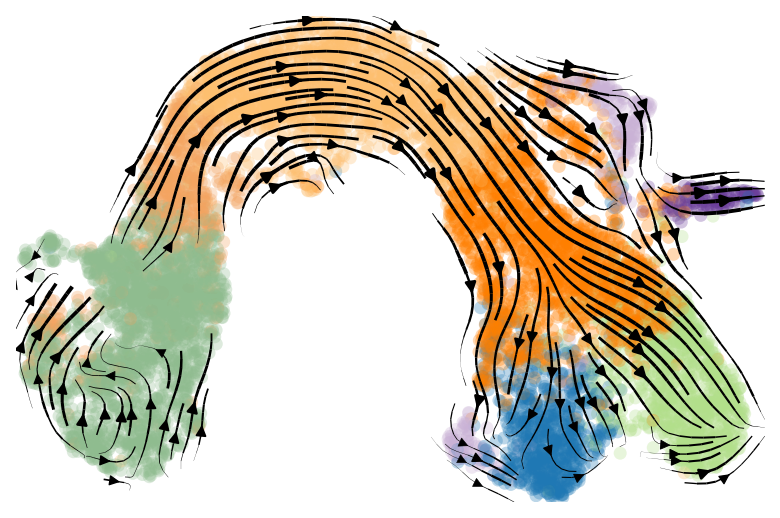

In [19]:
adata.uns["celltype_colors"] = celltype_colors
with mplscience.style_context():
    fig, ax = plt.subplots(figsize=(6, 4))
    scv.pl.velocity_embedding_stream(
        adata, vkey="velocities_velovi_s_sum", color=["celltype"], cmap="viridis", legend_loc=False, title="", ax=ax
    )
    plt.show()
    if SAVE_FIGURES:
        path = FIG_DIR / "uncertainty"
        path.mkdir(parents=True, exist_ok=True)
        fig.savefig(path / "velo_embedding_s_sum.svg", format="svg", transparent=True, bbox_inches="tight")
        fig.savefig(path / "velo_embedding_s_sum_e15.png", format="png", dpi=500, transparent=True, bbox_inches="tight")

[Parallel(n_jobs=3)]: Using backend LokyBackend with 3 concurrent workers.
/vol/storage/miniconda3/envs/conda_env_robin/lib/python3.9/site-packages/umap/distances.py:1063: NumbaDeprecationWarning: The 'nopython' keyword argument was not supplied to the 'numba.jit' decorator. The implicit default value for this argument is currently False, but it will be changed to True in Numba 0.59.0. See https://numba.readthedocs.io/en/stable/reference/deprecation.html#deprecation-of-object-mode-fall-back-behaviour-when-using-jit for details.
  @numba.jit()
/vol/storage/miniconda3/envs/conda_env_robin/lib/python3.9/site-packages/umap/distances.py:1071: NumbaDeprecationWarning: The 'nopython' keyword argument was not supplied to the 'numba.jit' decorator. The implicit default value for this argument is currently False, but it will be changed to True in Numba 0.59.0. See https://numba.readthedocs.io/en/stable/reference/deprecation.html#deprecation-of-object-mode-fall-back-behaviour-when-using-jit for d

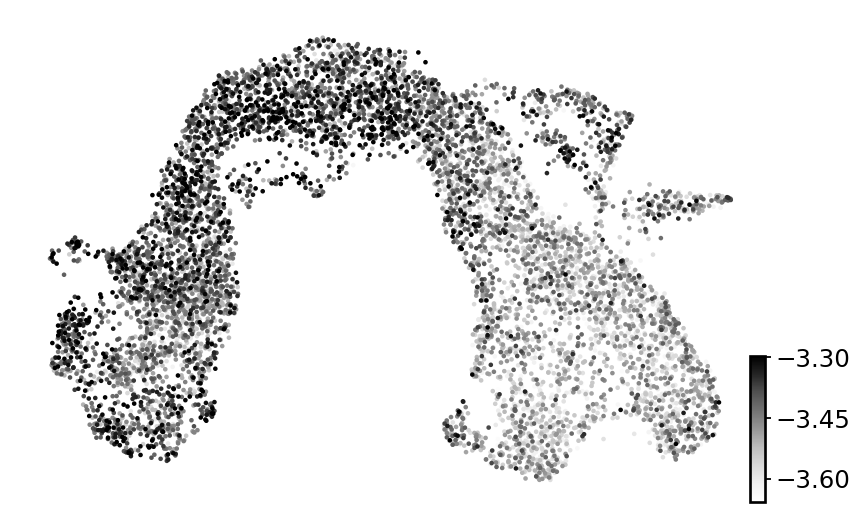

In [34]:
# Intrinsic
udf, _ = vae.get_directional_uncertainty(adata, velo_mode="spliced_sum", n_samples=50, n_jobs=3)

for c in udf.columns:
    adata.obs[c] = np.log10(udf[c].values)

with mplscience.style_context():
    fig, ax = plt.subplots(figsize=(6, 4))
    scv.pl.umap(adata, color="directional_cosine_sim_variance", perc=[5, 95], title="", cmap="Greys", ax=ax)

if SAVE_FIGURES:
    path = FIG_DIR / "uncertainty"
    path.mkdir(parents=True, exist_ok=True)
    fig.savefig(
        path / "directional_cosine_sim_variance_initrinsic_ssum_e15.svg",
        format="svg",
        transparent=True,
        bbox_inches="tight",
    )

## Spliced nucleic velo embedding and intrinsic uncertainty

computing velocity embedding
    finished (0:00:01) --> added
    'velocities_velovi_s_nuc_umap', embedded velocity vectors (adata.obsm)


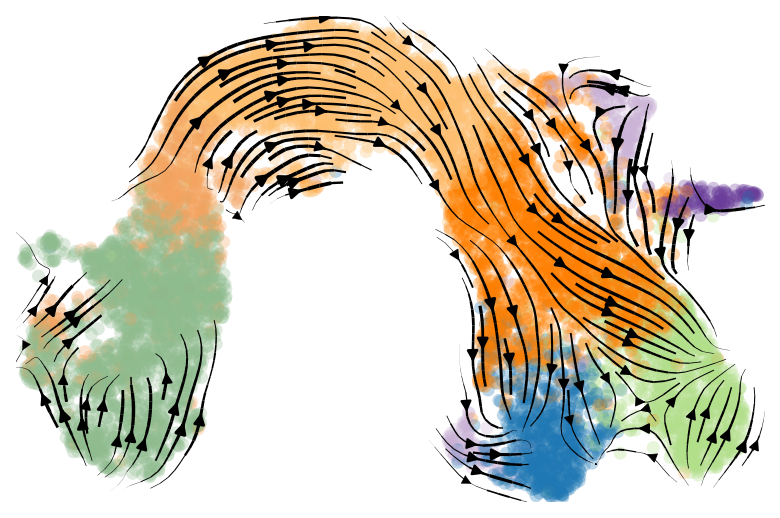

In [21]:
with mplscience.style_context():
    fig, ax = plt.subplots(figsize=(6, 4))
    scv.pl.velocity_embedding_stream(
        adata, vkey="velocities_velovi_s_nuc", color=["celltype"], cmap="viridis", legend_loc=False, title="", ax=ax
    )
    plt.show()
    if SAVE_FIGURES:
        path = FIG_DIR / "uncertainty"
        path.mkdir(parents=True, exist_ok=True)
        fig.savefig(path / "velo_embedding_snuc_e15.svg", format="svg", transparent=True, bbox_inches="tight")
        fig.savefig(path / "velo_embedding_snuc_e15.png", format="png", dpi=500, transparent=True, bbox_inches="tight")

[Parallel(n_jobs=3)]: Using backend LokyBackend with 3 concurrent workers.
/vol/storage/miniconda3/envs/conda_env_robin/lib/python3.9/site-packages/umap/distances.py:1063: NumbaDeprecationWarning: The 'nopython' keyword argument was not supplied to the 'numba.jit' decorator. The implicit default value for this argument is currently False, but it will be changed to True in Numba 0.59.0. See https://numba.readthedocs.io/en/stable/reference/deprecation.html#deprecation-of-object-mode-fall-back-behaviour-when-using-jit for details.
  @numba.jit()
/vol/storage/miniconda3/envs/conda_env_robin/lib/python3.9/site-packages/umap/distances.py:1063: NumbaDeprecationWarning: The 'nopython' keyword argument was not supplied to the 'numba.jit' decorator. The implicit default value for this argument is currently False, but it will be changed to True in Numba 0.59.0. See https://numba.readthedocs.io/en/stable/reference/deprecation.html#deprecation-of-object-mode-fall-back-behaviour-when-using-jit for d

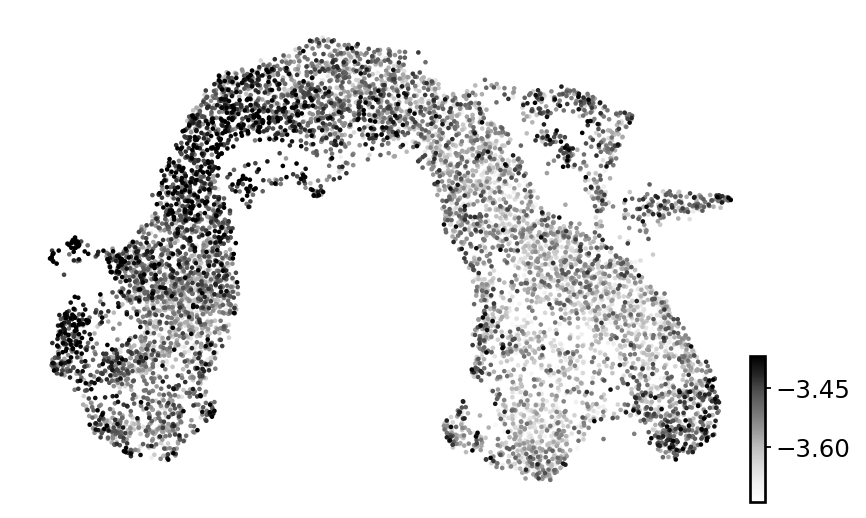

In [42]:
# Intrinsic
udf, _ = vae.get_directional_uncertainty(adata, velo_mode="spliced_nuc", n_samples=50, n_jobs=3)

for c in udf.columns:
    adata.obs[c] = np.log10(udf[c].values)

with mplscience.style_context():
    fig, ax = plt.subplots(figsize=(6, 4))
    scv.pl.umap(adata, color="directional_cosine_sim_variance", perc=[5, 95], title="", cmap="Greys", ax=ax)

if SAVE_FIGURES:
    path = FIG_DIR / "uncertainty"
    path.mkdir(parents=True, exist_ok=True)
    fig.savefig(
        path / "directional_cosine_sim_variance_initrinsic_snuc_e15.svg",
        format="svg",
        transparent=True,
        bbox_inches="tight",
    )

## Spliced nucleic velo embedding and intrinsic uncertainty

computing velocity embedding
    finished (0:00:01) --> added
    'velocities_velovi_s_cyt_umap', embedded velocity vectors (adata.obsm)


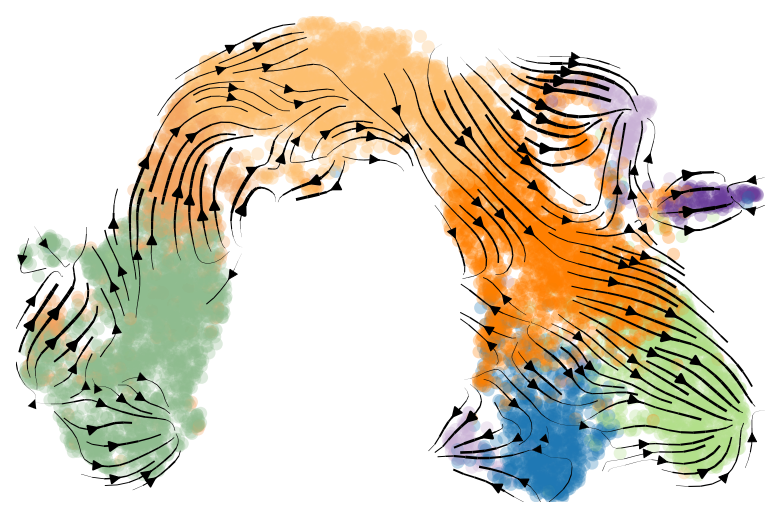

In [23]:
adata.uns["celltype_colors"] = celltype_colors
with mplscience.style_context():
    fig, ax = plt.subplots(figsize=(6, 4))
    scv.pl.velocity_embedding_stream(
        adata, vkey="velocities_velovi_s_cyt", color=["celltype"], cmap="viridis", legend_loc=False, title="", ax=ax
    )
    plt.show()
    if SAVE_FIGURES:
        path = FIG_DIR / "uncertainty"
        path.mkdir(parents=True, exist_ok=True)
        fig.savefig(path / "velo_embedding_s_cyt_e15.svg", format="svg", transparent=True, bbox_inches="tight")
        fig.savefig(path / "velo_embedding_s_cyt_e15.png", format="png", dpi=500, transparent=True, bbox_inches="tight")

[Parallel(n_jobs=3)]: Using backend LokyBackend with 3 concurrent workers.
[Parallel(n_jobs=3)]: Done 122 tasks      | elapsed:    0.2s
[Parallel(n_jobs=3)]: Done 5882 tasks      | elapsed:    9.0s
[Parallel(n_jobs=3)]: Done 8403 out of 8403 | elapsed:   12.6s finished


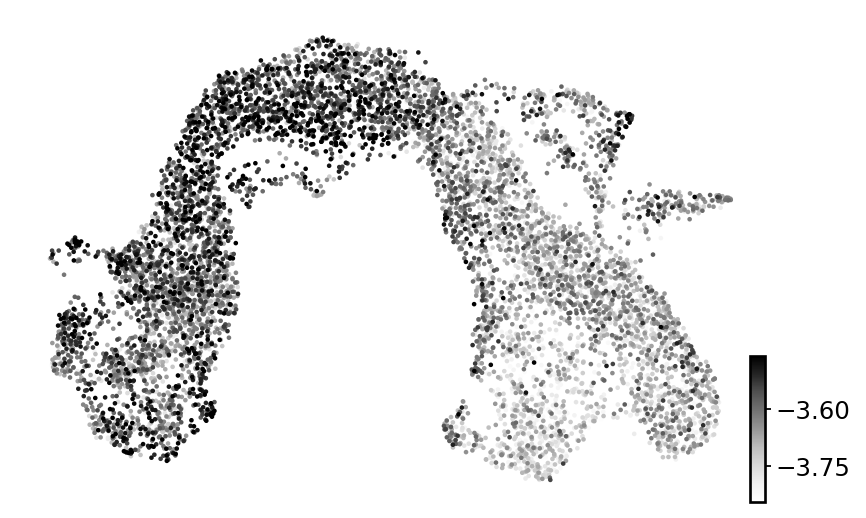

In [24]:
# Intrinsic
udf, _ = vae.get_directional_uncertainty(adata, velo_mode="spliced_cyt", n_samples=50, n_jobs=3)

for c in udf.columns:
    adata.obs[c] = np.log10(udf[c].values)

with mplscience.style_context():
    fig, ax = plt.subplots(figsize=(6, 4))
    scv.pl.umap(adata, color="directional_cosine_sim_variance", perc=[5, 95], title="", cmap="Greys", ax=ax)

if SAVE_FIGURES:
    path = FIG_DIR / "uncertainty"
    path.mkdir(parents=True, exist_ok=True)
    fig.savefig(
        path / "directional_cosine_sim_variance_initrinsic_scyt_e15.svg",
        format="svg",
        transparent=True,
        bbox_inches="tight",
    )

## Single-cell uncertainties

computing velocity embedding
    finished (0:00:00) --> added
    'velocities_velovi_umap', embedded velocity vectors (adata.obsm)


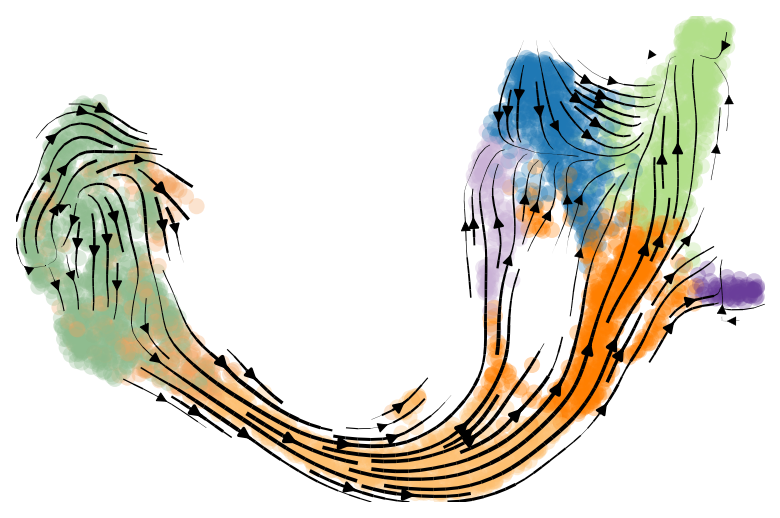

In [25]:
with mplscience.style_context():
    fig, ax = plt.subplots(figsize=(6, 4))
    scv.pl.velocity_embedding_stream(
        adata_sc, vkey="velocities_velovi", color=["celltype"], cmap="viridis", legend_loc=False, title="", ax=ax
    )
    plt.show()
    if SAVE_FIGURES:
        path = FIG_DIR / "uncertainty"
        path.mkdir(parents=True, exist_ok=True)
        fig.savefig(path / "velo_embedding_sc_e15.svg", format="svg", transparent=True, bbox_inches="tight")
        fig.savefig(
            path / "velo_embedding_sc_e15_e15.png", format="png", dpi=500, transparent=True, bbox_inches="tight"
        )

INFO     velovi: Sampling from model...                                                                            
INFO     velovi: Computing the uncertainties...                                                                    


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 14 concurrent workers.
/vol/storage/miniconda3/envs/conda_env_robin/lib/python3.9/site-packages/scvi/_settings.py:63: UserWarning: Since v1.0.0, scvi-tools no longer uses a random seed by default. Run `scvi.settings.seed = 0` to reproduce results from previous versions.
  self.seed = seed
/vol/storage/miniconda3/envs/conda_env_robin/lib/python3.9/site-packages/scvi/_settings.py:70: UserWarning: Setting `dl_pin_memory_gpu_training` is deprecated in v1.0 and will be removed in v1.1. Please pass in `pin_memory` to the data loaders instead.
  self.dl_pin_memory_gpu_training = (
/vol/storage/miniconda3/envs/conda_env_robin/lib/python3.9/site-packages/scvi/_settings.py:63: UserWarning: Since v1.0.0, scvi-tools no longer uses a random seed by default. Run `scvi.settings.seed = 0` to reproduce results from previous versions.
  self.seed = seed
/vol/storage/miniconda3/envs/conda_env_robin/lib/python3.9/site-packages/scvi/_settings.py:70: Use

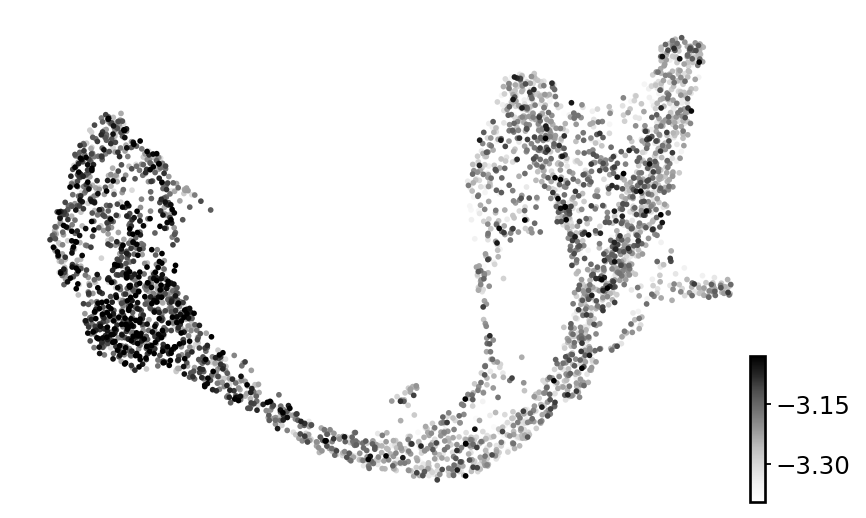

In [26]:
# Intrinsic
udf, _ = vae_sc.get_directional_uncertainty(adata_sc, n_samples=50)

for c in udf.columns:
    adata_sc.obs[c] = np.log10(udf[c].values)

with mplscience.style_context():
    fig, ax = plt.subplots(figsize=(6, 4))
    scv.pl.umap(adata_sc, color="directional_cosine_sim_variance", perc=[5, 95], title="", cmap="Greys", ax=ax)

if SAVE_FIGURES:
    path = FIG_DIR / "uncertainty"
    path.mkdir(parents=True, exist_ok=True)
    fig.savefig(
        path / "directional_cosine_sim_variance_initrinsic_sc_e15.svg",
        format="svg",
        transparent=True,
        bbox_inches="tight",
    )

## Single-nucleus uncertainties

computing velocity embedding
    finished (0:00:00) --> added
    'velocities_velovi_umap', embedded velocity vectors (adata.obsm)


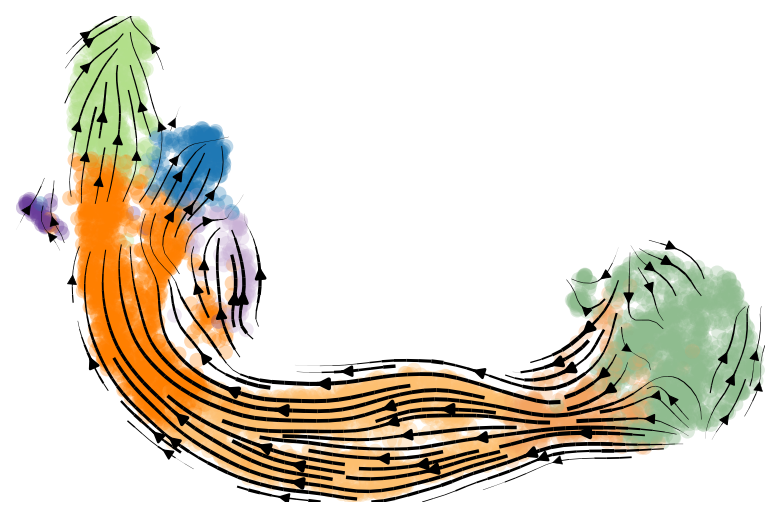

In [27]:
with mplscience.style_context():
    fig, ax = plt.subplots(figsize=(6, 4))
    scv.pl.velocity_embedding_stream(
        adata_sn, vkey="velocities_velovi", color=["celltype"], cmap="viridis", legend_loc=False, title="", ax=ax
    )
    plt.show()
    if SAVE_FIGURES:
        path = FIG_DIR / "uncertainty"
        path.mkdir(parents=True, exist_ok=True)
        fig.savefig(path / "velo_embedding_sn_e15.svg", format="svg", transparent=True, bbox_inches="tight")
        fig.savefig(path / "velo_embedding_sn_e15.png", format="png", dpi=500, transparent=True, bbox_inches="tight")

INFO     velovi: Sampling from model...                                                                            
INFO     velovi: Computing the uncertainties...                                                                    


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 14 concurrent workers.
[Parallel(n_jobs=-1)]: Done   4 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 324 tasks      | elapsed:    0.6s
[Parallel(n_jobs=-1)]: Done 1604 tasks      | elapsed:    2.3s
[Parallel(n_jobs=-1)]: Done 3396 tasks      | elapsed:    4.2s
[Parallel(n_jobs=-1)]: Done 4716 out of 4716 | elapsed:    5.7s finished


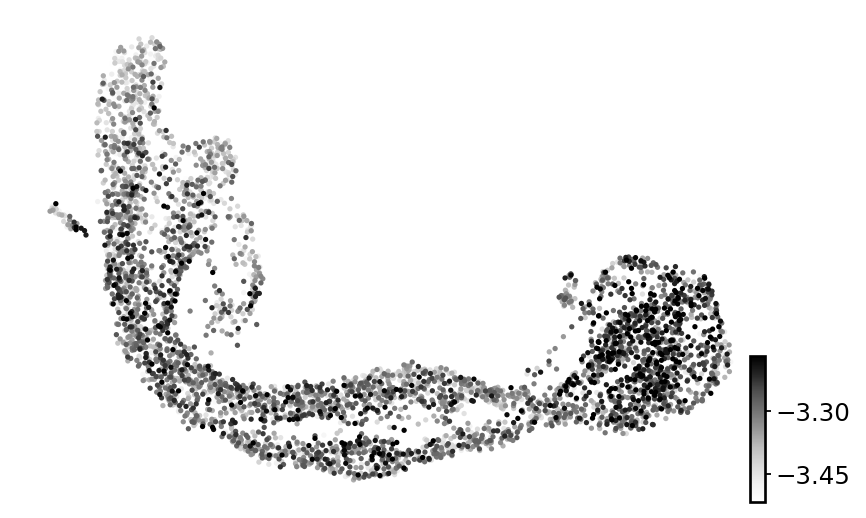

In [28]:
# Intrinsic
udf, _ = vae_sn.get_directional_uncertainty(adata_sn, n_samples=50)

for c in udf.columns:
    adata_sn.obs[c] = np.log10(udf[c].values)

with mplscience.style_context():
    fig, ax = plt.subplots(figsize=(6, 4))
    scv.pl.umap(adata_sn, color="directional_cosine_sim_variance", perc=[5, 95], title="", cmap="Greys", ax=ax)

if SAVE_FIGURES:
    path = FIG_DIR / "uncertainty"
    path.mkdir(parents=True, exist_ok=True)
    fig.savefig(
        path / "directional_cosine_sim_variance_initrinsic_sn_e15.svg",
        format="svg",
        transparent=True,
        bbox_inches="tight",
    )

## Extrinsic uncertainties

#### s_sum

In [36]:
extrapolated_cells_list = []
for i in range(25):
    vkey = f"velocities_velovi_{i}"
    v = vae.get_velocity(n_samples=1, velo_statistic="mean", velo_mode="spliced_sum")
    adata.layers[vkey] = v
    scv.tl.velocity_graph(adata, vkey=vkey, xkey="Ms_sum", sqrt_transform=False, approx=True)
    t_mat = scv.utils.get_transition_matrix(adata, vkey=vkey, self_transitions=True, use_negative_cosines=True)
    extrapolated_cells = np.asarray(t_mat @ adata.layers["Ms_sum"])
    extrapolated_cells_list.append(extrapolated_cells)
extrapolated_cells = np.stack(extrapolated_cells_list)

computing velocity graph (using 1/14 cores)


  0%|          | 0/8403 [00:00<?, ?cells/s]

IOPub data rate exceeded.
The Jupyter server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--ServerApp.iopub_data_rate_limit`.

Current values:
ServerApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
ServerApp.rate_limit_window=3.0 (secs)



    finished (0:00:15) --> added 
    'velocities_velovi_0_graph', sparse matrix with cosine correlations (adata.uns)
computing velocity graph (using 1/14 cores)


  0%|          | 0/8403 [00:00<?, ?cells/s]

IOPub data rate exceeded.
The Jupyter server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--ServerApp.iopub_data_rate_limit`.

Current values:
ServerApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
ServerApp.rate_limit_window=3.0 (secs)



    finished (0:00:16) --> added 
    'velocities_velovi_1_graph', sparse matrix with cosine correlations (adata.uns)
computing velocity graph (using 1/14 cores)


  0%|          | 0/8403 [00:00<?, ?cells/s]

IOPub data rate exceeded.
The Jupyter server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--ServerApp.iopub_data_rate_limit`.

Current values:
ServerApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
ServerApp.rate_limit_window=3.0 (secs)



    finished (0:00:15) --> added 
    'velocities_velovi_2_graph', sparse matrix with cosine correlations (adata.uns)
computing velocity graph (using 1/14 cores)


  0%|          | 0/8403 [00:00<?, ?cells/s]

IOPub data rate exceeded.
The Jupyter server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--ServerApp.iopub_data_rate_limit`.

Current values:
ServerApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
ServerApp.rate_limit_window=3.0 (secs)



    finished (0:00:15) --> added 
    'velocities_velovi_3_graph', sparse matrix with cosine correlations (adata.uns)
computing velocity graph (using 1/14 cores)


  0%|          | 0/8403 [00:00<?, ?cells/s]

IOPub data rate exceeded.
The Jupyter server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--ServerApp.iopub_data_rate_limit`.

Current values:
ServerApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
ServerApp.rate_limit_window=3.0 (secs)



    finished (0:00:16) --> added 
    'velocities_velovi_4_graph', sparse matrix with cosine correlations (adata.uns)
computing velocity graph (using 1/14 cores)


  0%|          | 0/8403 [00:00<?, ?cells/s]

IOPub data rate exceeded.
The Jupyter server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--ServerApp.iopub_data_rate_limit`.

Current values:
ServerApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
ServerApp.rate_limit_window=3.0 (secs)



    finished (0:00:15) --> added 
    'velocities_velovi_5_graph', sparse matrix with cosine correlations (adata.uns)
computing velocity graph (using 1/14 cores)


  0%|          | 0/8403 [00:00<?, ?cells/s]

IOPub data rate exceeded.
The Jupyter server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--ServerApp.iopub_data_rate_limit`.

Current values:
ServerApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
ServerApp.rate_limit_window=3.0 (secs)



    finished (0:00:15) --> added 
    'velocities_velovi_6_graph', sparse matrix with cosine correlations (adata.uns)
computing velocity graph (using 1/14 cores)


  0%|          | 0/8403 [00:00<?, ?cells/s]

IOPub data rate exceeded.
The Jupyter server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--ServerApp.iopub_data_rate_limit`.

Current values:
ServerApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
ServerApp.rate_limit_window=3.0 (secs)



    finished (0:00:16) --> added 
    'velocities_velovi_7_graph', sparse matrix with cosine correlations (adata.uns)
computing velocity graph (using 1/14 cores)


  0%|          | 0/8403 [00:00<?, ?cells/s]

IOPub data rate exceeded.
The Jupyter server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--ServerApp.iopub_data_rate_limit`.

Current values:
ServerApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
ServerApp.rate_limit_window=3.0 (secs)



    finished (0:00:16) --> added 
    'velocities_velovi_8_graph', sparse matrix with cosine correlations (adata.uns)
computing velocity graph (using 1/14 cores)


  0%|          | 0/8403 [00:00<?, ?cells/s]

IOPub data rate exceeded.
The Jupyter server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--ServerApp.iopub_data_rate_limit`.

Current values:
ServerApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
ServerApp.rate_limit_window=3.0 (secs)



    finished (0:00:16) --> added 
    'velocities_velovi_9_graph', sparse matrix with cosine correlations (adata.uns)
computing velocity graph (using 1/14 cores)


  0%|          | 0/8403 [00:00<?, ?cells/s]

IOPub data rate exceeded.
The Jupyter server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--ServerApp.iopub_data_rate_limit`.

Current values:
ServerApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
ServerApp.rate_limit_window=3.0 (secs)



    finished (0:00:18) --> added 
    'velocities_velovi_10_graph', sparse matrix with cosine correlations (adata.uns)
computing velocity graph (using 1/14 cores)


  0%|          | 0/8403 [00:00<?, ?cells/s]

IOPub data rate exceeded.
The Jupyter server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--ServerApp.iopub_data_rate_limit`.

Current values:
ServerApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
ServerApp.rate_limit_window=3.0 (secs)



    finished (0:00:16) --> added 
    'velocities_velovi_11_graph', sparse matrix with cosine correlations (adata.uns)
computing velocity graph (using 1/14 cores)


  0%|          | 0/8403 [00:00<?, ?cells/s]

IOPub data rate exceeded.
The Jupyter server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--ServerApp.iopub_data_rate_limit`.

Current values:
ServerApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
ServerApp.rate_limit_window=3.0 (secs)



    finished (0:00:16) --> added 
    'velocities_velovi_12_graph', sparse matrix with cosine correlations (adata.uns)
computing velocity graph (using 1/14 cores)


  0%|          | 0/8403 [00:00<?, ?cells/s]

IOPub data rate exceeded.
The Jupyter server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--ServerApp.iopub_data_rate_limit`.

Current values:
ServerApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
ServerApp.rate_limit_window=3.0 (secs)



    finished (0:00:16) --> added 
    'velocities_velovi_13_graph', sparse matrix with cosine correlations (adata.uns)
computing velocity graph (using 1/14 cores)


  0%|          | 0/8403 [00:00<?, ?cells/s]

IOPub data rate exceeded.
The Jupyter server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--ServerApp.iopub_data_rate_limit`.

Current values:
ServerApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
ServerApp.rate_limit_window=3.0 (secs)



    finished (0:00:16) --> added 
    'velocities_velovi_14_graph', sparse matrix with cosine correlations (adata.uns)
computing velocity graph (using 1/14 cores)


  0%|          | 0/8403 [00:00<?, ?cells/s]

IOPub data rate exceeded.
The Jupyter server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--ServerApp.iopub_data_rate_limit`.

Current values:
ServerApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
ServerApp.rate_limit_window=3.0 (secs)



    finished (0:00:15) --> added 
    'velocities_velovi_15_graph', sparse matrix with cosine correlations (adata.uns)
computing velocity graph (using 1/14 cores)


  0%|          | 0/8403 [00:00<?, ?cells/s]

IOPub data rate exceeded.
The Jupyter server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--ServerApp.iopub_data_rate_limit`.

Current values:
ServerApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
ServerApp.rate_limit_window=3.0 (secs)



    finished (0:00:16) --> added 
    'velocities_velovi_16_graph', sparse matrix with cosine correlations (adata.uns)
computing velocity graph (using 1/14 cores)


  0%|          | 0/8403 [00:00<?, ?cells/s]

IOPub data rate exceeded.
The Jupyter server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--ServerApp.iopub_data_rate_limit`.

Current values:
ServerApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
ServerApp.rate_limit_window=3.0 (secs)



    finished (0:00:17) --> added 
    'velocities_velovi_17_graph', sparse matrix with cosine correlations (adata.uns)
computing velocity graph (using 1/14 cores)


  0%|          | 0/8403 [00:00<?, ?cells/s]

IOPub data rate exceeded.
The Jupyter server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--ServerApp.iopub_data_rate_limit`.

Current values:
ServerApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
ServerApp.rate_limit_window=3.0 (secs)



    finished (0:00:17) --> added 
    'velocities_velovi_18_graph', sparse matrix with cosine correlations (adata.uns)
computing velocity graph (using 1/14 cores)


  0%|          | 0/8403 [00:00<?, ?cells/s]

IOPub data rate exceeded.
The Jupyter server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--ServerApp.iopub_data_rate_limit`.

Current values:
ServerApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
ServerApp.rate_limit_window=3.0 (secs)



    finished (0:00:16) --> added 
    'velocities_velovi_19_graph', sparse matrix with cosine correlations (adata.uns)
computing velocity graph (using 1/14 cores)


  0%|          | 0/8403 [00:00<?, ?cells/s]

IOPub data rate exceeded.
The Jupyter server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--ServerApp.iopub_data_rate_limit`.

Current values:
ServerApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
ServerApp.rate_limit_window=3.0 (secs)



    finished (0:00:16) --> added 
    'velocities_velovi_20_graph', sparse matrix with cosine correlations (adata.uns)
computing velocity graph (using 1/14 cores)


  0%|          | 0/8403 [00:00<?, ?cells/s]

IOPub data rate exceeded.
The Jupyter server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--ServerApp.iopub_data_rate_limit`.

Current values:
ServerApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
ServerApp.rate_limit_window=3.0 (secs)



    finished (0:00:16) --> added 
    'velocities_velovi_21_graph', sparse matrix with cosine correlations (adata.uns)
computing velocity graph (using 1/14 cores)


  0%|          | 0/8403 [00:00<?, ?cells/s]

IOPub data rate exceeded.
The Jupyter server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--ServerApp.iopub_data_rate_limit`.

Current values:
ServerApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
ServerApp.rate_limit_window=3.0 (secs)



    finished (0:00:16) --> added 
    'velocities_velovi_22_graph', sparse matrix with cosine correlations (adata.uns)
computing velocity graph (using 1/14 cores)


  0%|          | 0/8403 [00:00<?, ?cells/s]

IOPub data rate exceeded.
The Jupyter server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--ServerApp.iopub_data_rate_limit`.

Current values:
ServerApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
ServerApp.rate_limit_window=3.0 (secs)



    finished (0:00:16) --> added 
    'velocities_velovi_23_graph', sparse matrix with cosine correlations (adata.uns)
computing velocity graph (using 1/14 cores)


  0%|          | 0/8403 [00:00<?, ?cells/s]

IOPub data rate exceeded.
The Jupyter server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--ServerApp.iopub_data_rate_limit`.

Current values:
ServerApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
ServerApp.rate_limit_window=3.0 (secs)



    finished (0:00:16) --> added 
    'velocities_velovi_24_graph', sparse matrix with cosine correlations (adata.uns)


[Parallel(n_jobs=3)]: Using backend LokyBackend with 3 concurrent workers.
/vol/storage/miniconda3/envs/conda_env_robin/lib/python3.9/site-packages/umap/distances.py:1063: NumbaDeprecationWarning: The 'nopython' keyword argument was not supplied to the 'numba.jit' decorator. The implicit default value for this argument is currently False, but it will be changed to True in Numba 0.59.0. See https://numba.readthedocs.io/en/stable/reference/deprecation.html#deprecation-of-object-mode-fall-back-behaviour-when-using-jit for details.
  @numba.jit()
/vol/storage/miniconda3/envs/conda_env_robin/lib/python3.9/site-packages/umap/distances.py:1071: NumbaDeprecationWarning: The 'nopython' keyword argument was not supplied to the 'numba.jit' decorator. The implicit default value for this argument is currently False, but it will be changed to True in Numba 0.59.0. See https://numba.readthedocs.io/en/stable/reference/deprecation.html#deprecation-of-object-mode-fall-back-behaviour-when-using-jit for d

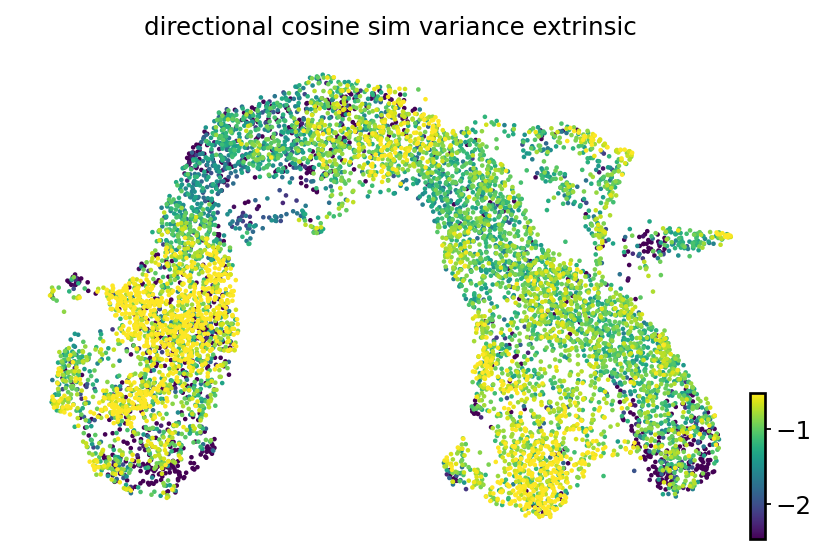

In [37]:
df, _ = _compute_directional_statistics_tensor(extrapolated_cells, n_jobs=3, n_cells=adata.n_obs)

for c in df.columns:
    adata.obs[c + "_extrinsic"] = np.log10(df[c].values)

with mplscience.style_context():
    fig, ax = plt.subplots(figsize=(6, 4))
    scv.pl.umap(adata, color="directional_cosine_sim_variance_extrinsic", perc=[10, 90], cmap="viridis", ax=ax)

    if SAVE_FIGURES:
        path = FIG_DIR / "uncertainty"
        path.mkdir(parents=True, exist_ok=True)
        fig.savefig(
            path / "directional_cosine_sim_variance_extrinsic_ssum_e15.svg",
            format="svg",
            transparent=True,
            bbox_inches="tight",
        )

## scyt

In [32]:
extrapolated_cells_list = []
for i in range(25):
    vkey = f"velocities_velovi_{i}"
    v = vae.get_velocity(n_samples=1, velo_statistic="mean", velo_mode="spliced_cyt")
    adata.layers[vkey] = v
    scv.tl.velocity_graph(adata, vkey=vkey, xkey="Ms_cyt", sqrt_transform=False, approx=True)
    t_mat = scv.utils.get_transition_matrix(adata, vkey=vkey, self_transitions=True, use_negative_cosines=True)
    extrapolated_cells = np.asarray(t_mat @ adata.layers["Ms_cyt"])
    extrapolated_cells_list.append(extrapolated_cells)
extrapolated_cells = np.stack(extrapolated_cells_list)

computing velocity graph (using 1/14 cores)


  0%|          | 0/8403 [00:00<?, ?cells/s]

IOPub data rate exceeded.
The Jupyter server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--ServerApp.iopub_data_rate_limit`.

Current values:
ServerApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
ServerApp.rate_limit_window=3.0 (secs)



    finished (0:00:16) --> added 
    'velocities_velovi_0_graph', sparse matrix with cosine correlations (adata.uns)
computing velocity graph (using 1/14 cores)


  0%|          | 0/8403 [00:00<?, ?cells/s]

IOPub data rate exceeded.
The Jupyter server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--ServerApp.iopub_data_rate_limit`.

Current values:
ServerApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
ServerApp.rate_limit_window=3.0 (secs)



    finished (0:00:16) --> added 
    'velocities_velovi_1_graph', sparse matrix with cosine correlations (adata.uns)
computing velocity graph (using 1/14 cores)


  0%|          | 0/8403 [00:00<?, ?cells/s]

IOPub data rate exceeded.
The Jupyter server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--ServerApp.iopub_data_rate_limit`.

Current values:
ServerApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
ServerApp.rate_limit_window=3.0 (secs)



    finished (0:00:17) --> added 
    'velocities_velovi_2_graph', sparse matrix with cosine correlations (adata.uns)
computing velocity graph (using 1/14 cores)


  0%|          | 0/8403 [00:00<?, ?cells/s]

IOPub data rate exceeded.
The Jupyter server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--ServerApp.iopub_data_rate_limit`.

Current values:
ServerApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
ServerApp.rate_limit_window=3.0 (secs)



    finished (0:00:17) --> added 
    'velocities_velovi_3_graph', sparse matrix with cosine correlations (adata.uns)
computing velocity graph (using 1/14 cores)


  0%|          | 0/8403 [00:00<?, ?cells/s]

IOPub data rate exceeded.
The Jupyter server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--ServerApp.iopub_data_rate_limit`.

Current values:
ServerApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
ServerApp.rate_limit_window=3.0 (secs)



    finished (0:00:15) --> added 
    'velocities_velovi_4_graph', sparse matrix with cosine correlations (adata.uns)
computing velocity graph (using 1/14 cores)


  0%|          | 0/8403 [00:00<?, ?cells/s]

IOPub data rate exceeded.
The Jupyter server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--ServerApp.iopub_data_rate_limit`.

Current values:
ServerApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
ServerApp.rate_limit_window=3.0 (secs)



    finished (0:00:16) --> added 
    'velocities_velovi_5_graph', sparse matrix with cosine correlations (adata.uns)
computing velocity graph (using 1/14 cores)


  0%|          | 0/8403 [00:00<?, ?cells/s]

IOPub data rate exceeded.
The Jupyter server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--ServerApp.iopub_data_rate_limit`.

Current values:
ServerApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
ServerApp.rate_limit_window=3.0 (secs)



    finished (0:00:20) --> added 
    'velocities_velovi_6_graph', sparse matrix with cosine correlations (adata.uns)
computing velocity graph (using 1/14 cores)


  0%|          | 0/8403 [00:00<?, ?cells/s]

IOPub data rate exceeded.
The Jupyter server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--ServerApp.iopub_data_rate_limit`.

Current values:
ServerApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
ServerApp.rate_limit_window=3.0 (secs)



    finished (0:00:17) --> added 
    'velocities_velovi_7_graph', sparse matrix with cosine correlations (adata.uns)
computing velocity graph (using 1/14 cores)


  0%|          | 0/8403 [00:00<?, ?cells/s]

IOPub data rate exceeded.
The Jupyter server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--ServerApp.iopub_data_rate_limit`.

Current values:
ServerApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
ServerApp.rate_limit_window=3.0 (secs)



    finished (0:00:17) --> added 
    'velocities_velovi_8_graph', sparse matrix with cosine correlations (adata.uns)
computing velocity graph (using 1/14 cores)


  0%|          | 0/8403 [00:00<?, ?cells/s]

IOPub data rate exceeded.
The Jupyter server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--ServerApp.iopub_data_rate_limit`.

Current values:
ServerApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
ServerApp.rate_limit_window=3.0 (secs)



    finished (0:00:16) --> added 
    'velocities_velovi_9_graph', sparse matrix with cosine correlations (adata.uns)
computing velocity graph (using 1/14 cores)


  0%|          | 0/8403 [00:00<?, ?cells/s]

IOPub data rate exceeded.
The Jupyter server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--ServerApp.iopub_data_rate_limit`.

Current values:
ServerApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
ServerApp.rate_limit_window=3.0 (secs)



    finished (0:00:16) --> added 
    'velocities_velovi_10_graph', sparse matrix with cosine correlations (adata.uns)
computing velocity graph (using 1/14 cores)


  0%|          | 0/8403 [00:00<?, ?cells/s]

IOPub data rate exceeded.
The Jupyter server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--ServerApp.iopub_data_rate_limit`.

Current values:
ServerApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
ServerApp.rate_limit_window=3.0 (secs)



    finished (0:00:15) --> added 
    'velocities_velovi_11_graph', sparse matrix with cosine correlations (adata.uns)
computing velocity graph (using 1/14 cores)


  0%|          | 0/8403 [00:00<?, ?cells/s]

IOPub data rate exceeded.
The Jupyter server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--ServerApp.iopub_data_rate_limit`.

Current values:
ServerApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
ServerApp.rate_limit_window=3.0 (secs)



    finished (0:00:16) --> added 
    'velocities_velovi_12_graph', sparse matrix with cosine correlations (adata.uns)
computing velocity graph (using 1/14 cores)


  0%|          | 0/8403 [00:00<?, ?cells/s]

IOPub data rate exceeded.
The Jupyter server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--ServerApp.iopub_data_rate_limit`.

Current values:
ServerApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
ServerApp.rate_limit_window=3.0 (secs)



    finished (0:00:16) --> added 
    'velocities_velovi_13_graph', sparse matrix with cosine correlations (adata.uns)
computing velocity graph (using 1/14 cores)


  0%|          | 0/8403 [00:00<?, ?cells/s]

IOPub data rate exceeded.
The Jupyter server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--ServerApp.iopub_data_rate_limit`.

Current values:
ServerApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
ServerApp.rate_limit_window=3.0 (secs)



    finished (0:00:16) --> added 
    'velocities_velovi_14_graph', sparse matrix with cosine correlations (adata.uns)
computing velocity graph (using 1/14 cores)


  0%|          | 0/8403 [00:00<?, ?cells/s]

IOPub data rate exceeded.
The Jupyter server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--ServerApp.iopub_data_rate_limit`.

Current values:
ServerApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
ServerApp.rate_limit_window=3.0 (secs)



    finished (0:00:17) --> added 
    'velocities_velovi_15_graph', sparse matrix with cosine correlations (adata.uns)
computing velocity graph (using 1/14 cores)


  0%|          | 0/8403 [00:00<?, ?cells/s]

IOPub data rate exceeded.
The Jupyter server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--ServerApp.iopub_data_rate_limit`.

Current values:
ServerApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
ServerApp.rate_limit_window=3.0 (secs)



    finished (0:00:16) --> added 
    'velocities_velovi_16_graph', sparse matrix with cosine correlations (adata.uns)
computing velocity graph (using 1/14 cores)


  0%|          | 0/8403 [00:00<?, ?cells/s]

IOPub data rate exceeded.
The Jupyter server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--ServerApp.iopub_data_rate_limit`.

Current values:
ServerApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
ServerApp.rate_limit_window=3.0 (secs)



    finished (0:00:16) --> added 
    'velocities_velovi_17_graph', sparse matrix with cosine correlations (adata.uns)
computing velocity graph (using 1/14 cores)


  0%|          | 0/8403 [00:00<?, ?cells/s]

IOPub data rate exceeded.
The Jupyter server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--ServerApp.iopub_data_rate_limit`.

Current values:
ServerApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
ServerApp.rate_limit_window=3.0 (secs)



    finished (0:00:16) --> added 
    'velocities_velovi_18_graph', sparse matrix with cosine correlations (adata.uns)
computing velocity graph (using 1/14 cores)


  0%|          | 0/8403 [00:00<?, ?cells/s]

IOPub data rate exceeded.
The Jupyter server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--ServerApp.iopub_data_rate_limit`.

Current values:
ServerApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
ServerApp.rate_limit_window=3.0 (secs)



    finished (0:00:15) --> added 
    'velocities_velovi_19_graph', sparse matrix with cosine correlations (adata.uns)
computing velocity graph (using 1/14 cores)


  0%|          | 0/8403 [00:00<?, ?cells/s]

IOPub data rate exceeded.
The Jupyter server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--ServerApp.iopub_data_rate_limit`.

Current values:
ServerApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
ServerApp.rate_limit_window=3.0 (secs)



    finished (0:00:16) --> added 
    'velocities_velovi_20_graph', sparse matrix with cosine correlations (adata.uns)
computing velocity graph (using 1/14 cores)


  0%|          | 0/8403 [00:00<?, ?cells/s]

IOPub data rate exceeded.
The Jupyter server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--ServerApp.iopub_data_rate_limit`.

Current values:
ServerApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
ServerApp.rate_limit_window=3.0 (secs)



    finished (0:00:16) --> added 
    'velocities_velovi_21_graph', sparse matrix with cosine correlations (adata.uns)
computing velocity graph (using 1/14 cores)


  0%|          | 0/8403 [00:00<?, ?cells/s]

IOPub data rate exceeded.
The Jupyter server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--ServerApp.iopub_data_rate_limit`.

Current values:
ServerApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
ServerApp.rate_limit_window=3.0 (secs)



    finished (0:00:16) --> added 
    'velocities_velovi_22_graph', sparse matrix with cosine correlations (adata.uns)
computing velocity graph (using 1/14 cores)


  0%|          | 0/8403 [00:00<?, ?cells/s]

IOPub data rate exceeded.
The Jupyter server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--ServerApp.iopub_data_rate_limit`.

Current values:
ServerApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
ServerApp.rate_limit_window=3.0 (secs)



    finished (0:00:15) --> added 
    'velocities_velovi_23_graph', sparse matrix with cosine correlations (adata.uns)
computing velocity graph (using 1/14 cores)


  0%|          | 0/8403 [00:00<?, ?cells/s]

IOPub data rate exceeded.
The Jupyter server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--ServerApp.iopub_data_rate_limit`.

Current values:
ServerApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
ServerApp.rate_limit_window=3.0 (secs)



    finished (0:00:19) --> added 
    'velocities_velovi_24_graph', sparse matrix with cosine correlations (adata.uns)


[Parallel(n_jobs=4)]: Using backend LokyBackend with 4 concurrent workers.
/vol/storage/miniconda3/envs/conda_env_robin/lib/python3.9/site-packages/umap/distances.py:1063: NumbaDeprecationWarning: The 'nopython' keyword argument was not supplied to the 'numba.jit' decorator. The implicit default value for this argument is currently False, but it will be changed to True in Numba 0.59.0. See https://numba.readthedocs.io/en/stable/reference/deprecation.html#deprecation-of-object-mode-fall-back-behaviour-when-using-jit for details.
  @numba.jit()
/vol/storage/miniconda3/envs/conda_env_robin/lib/python3.9/site-packages/umap/distances.py:1071: NumbaDeprecationWarning: The 'nopython' keyword argument was not supplied to the 'numba.jit' decorator. The implicit default value for this argument is currently False, but it will be changed to True in Numba 0.59.0. See https://numba.readthedocs.io/en/stable/reference/deprecation.html#deprecation-of-object-mode-fall-back-behaviour-when-using-jit for d

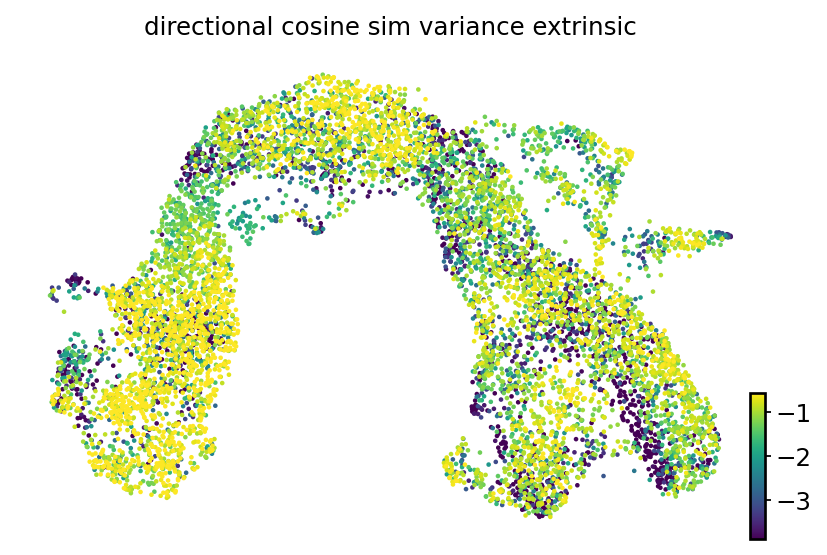

In [33]:
df, _ = _compute_directional_statistics_tensor(extrapolated_cells, n_jobs=4, n_cells=adata.n_obs)

for c in df.columns:
    adata.obs[c + "_extrinsic"] = np.log10(df[c].values)

with mplscience.style_context():
    fig, ax = plt.subplots(figsize=(6, 4))
    scv.pl.umap(adata, color="directional_cosine_sim_variance_extrinsic", perc=[10, 90], cmap="viridis", ax=ax)

    if SAVE_FIGURES:
        path = FIG_DIR / "uncertainty"
        path.mkdir(parents=True, exist_ok=True)
        fig.savefig(
            path / "directional_cosine_sim_variance_extrinsic_scyt_e15.svg",
            format="svg",
            transparent=True,
            bbox_inches="tight",
        )

## s_nuc

In [34]:
extrapolated_cells_list = []
for i in range(25):
    vkey = f"velocities_velovi_{i}"
    v = vae.get_velocity(n_samples=1, velo_statistic="mean", velo_mode="spliced_nuc")
    adata.layers[vkey] = v
    scv.tl.velocity_graph(adata, vkey=vkey, xkey="Ms_nuc", sqrt_transform=False, approx=True)
    t_mat = scv.utils.get_transition_matrix(adata, vkey=vkey, self_transitions=True, use_negative_cosines=True)
    extrapolated_cells = np.asarray(t_mat @ adata.layers["Ms_nuc"])
    extrapolated_cells_list.append(extrapolated_cells)
extrapolated_cells = np.stack(extrapolated_cells_list)

computing velocity graph (using 1/14 cores)


  0%|          | 0/8403 [00:00<?, ?cells/s]

IOPub data rate exceeded.
The Jupyter server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--ServerApp.iopub_data_rate_limit`.

Current values:
ServerApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
ServerApp.rate_limit_window=3.0 (secs)



    finished (0:00:16) --> added 
    'velocities_velovi_0_graph', sparse matrix with cosine correlations (adata.uns)
computing velocity graph (using 1/14 cores)


  0%|          | 0/8403 [00:00<?, ?cells/s]

IOPub data rate exceeded.
The Jupyter server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--ServerApp.iopub_data_rate_limit`.

Current values:
ServerApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
ServerApp.rate_limit_window=3.0 (secs)



    finished (0:00:16) --> added 
    'velocities_velovi_1_graph', sparse matrix with cosine correlations (adata.uns)
computing velocity graph (using 1/14 cores)


  0%|          | 0/8403 [00:00<?, ?cells/s]

IOPub data rate exceeded.
The Jupyter server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--ServerApp.iopub_data_rate_limit`.

Current values:
ServerApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
ServerApp.rate_limit_window=3.0 (secs)



    finished (0:00:16) --> added 
    'velocities_velovi_2_graph', sparse matrix with cosine correlations (adata.uns)
computing velocity graph (using 1/14 cores)


  0%|          | 0/8403 [00:00<?, ?cells/s]

IOPub data rate exceeded.
The Jupyter server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--ServerApp.iopub_data_rate_limit`.

Current values:
ServerApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
ServerApp.rate_limit_window=3.0 (secs)



    finished (0:00:15) --> added 
    'velocities_velovi_3_graph', sparse matrix with cosine correlations (adata.uns)
computing velocity graph (using 1/14 cores)


  0%|          | 0/8403 [00:00<?, ?cells/s]

IOPub data rate exceeded.
The Jupyter server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--ServerApp.iopub_data_rate_limit`.

Current values:
ServerApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
ServerApp.rate_limit_window=3.0 (secs)



    finished (0:00:16) --> added 
    'velocities_velovi_4_graph', sparse matrix with cosine correlations (adata.uns)
computing velocity graph (using 1/14 cores)


  0%|          | 0/8403 [00:00<?, ?cells/s]

IOPub data rate exceeded.
The Jupyter server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--ServerApp.iopub_data_rate_limit`.

Current values:
ServerApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
ServerApp.rate_limit_window=3.0 (secs)



    finished (0:00:16) --> added 
    'velocities_velovi_5_graph', sparse matrix with cosine correlations (adata.uns)
computing velocity graph (using 1/14 cores)


  0%|          | 0/8403 [00:00<?, ?cells/s]

IOPub data rate exceeded.
The Jupyter server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--ServerApp.iopub_data_rate_limit`.

Current values:
ServerApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
ServerApp.rate_limit_window=3.0 (secs)



    finished (0:00:16) --> added 
    'velocities_velovi_6_graph', sparse matrix with cosine correlations (adata.uns)
computing velocity graph (using 1/14 cores)


  0%|          | 0/8403 [00:00<?, ?cells/s]

IOPub data rate exceeded.
The Jupyter server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--ServerApp.iopub_data_rate_limit`.

Current values:
ServerApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
ServerApp.rate_limit_window=3.0 (secs)



    finished (0:00:17) --> added 
    'velocities_velovi_7_graph', sparse matrix with cosine correlations (adata.uns)
computing velocity graph (using 1/14 cores)


  0%|          | 0/8403 [00:00<?, ?cells/s]

IOPub data rate exceeded.
The Jupyter server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--ServerApp.iopub_data_rate_limit`.

Current values:
ServerApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
ServerApp.rate_limit_window=3.0 (secs)



    finished (0:00:17) --> added 
    'velocities_velovi_8_graph', sparse matrix with cosine correlations (adata.uns)
computing velocity graph (using 1/14 cores)


  0%|          | 0/8403 [00:00<?, ?cells/s]

IOPub data rate exceeded.
The Jupyter server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--ServerApp.iopub_data_rate_limit`.

Current values:
ServerApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
ServerApp.rate_limit_window=3.0 (secs)



    finished (0:00:17) --> added 
    'velocities_velovi_9_graph', sparse matrix with cosine correlations (adata.uns)
computing velocity graph (using 1/14 cores)


  0%|          | 0/8403 [00:00<?, ?cells/s]

IOPub data rate exceeded.
The Jupyter server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--ServerApp.iopub_data_rate_limit`.

Current values:
ServerApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
ServerApp.rate_limit_window=3.0 (secs)



    finished (0:00:17) --> added 
    'velocities_velovi_10_graph', sparse matrix with cosine correlations (adata.uns)
computing velocity graph (using 1/14 cores)


  0%|          | 0/8403 [00:00<?, ?cells/s]

IOPub data rate exceeded.
The Jupyter server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--ServerApp.iopub_data_rate_limit`.

Current values:
ServerApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
ServerApp.rate_limit_window=3.0 (secs)



    finished (0:00:16) --> added 
    'velocities_velovi_11_graph', sparse matrix with cosine correlations (adata.uns)
computing velocity graph (using 1/14 cores)


  0%|          | 0/8403 [00:00<?, ?cells/s]

IOPub data rate exceeded.
The Jupyter server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--ServerApp.iopub_data_rate_limit`.

Current values:
ServerApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
ServerApp.rate_limit_window=3.0 (secs)



    finished (0:00:17) --> added 
    'velocities_velovi_12_graph', sparse matrix with cosine correlations (adata.uns)
computing velocity graph (using 1/14 cores)


  0%|          | 0/8403 [00:00<?, ?cells/s]

IOPub data rate exceeded.
The Jupyter server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--ServerApp.iopub_data_rate_limit`.

Current values:
ServerApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
ServerApp.rate_limit_window=3.0 (secs)



    finished (0:00:16) --> added 
    'velocities_velovi_13_graph', sparse matrix with cosine correlations (adata.uns)
computing velocity graph (using 1/14 cores)


  0%|          | 0/8403 [00:00<?, ?cells/s]

IOPub data rate exceeded.
The Jupyter server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--ServerApp.iopub_data_rate_limit`.

Current values:
ServerApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
ServerApp.rate_limit_window=3.0 (secs)



    finished (0:00:16) --> added 
    'velocities_velovi_14_graph', sparse matrix with cosine correlations (adata.uns)
computing velocity graph (using 1/14 cores)


  0%|          | 0/8403 [00:00<?, ?cells/s]

IOPub data rate exceeded.
The Jupyter server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--ServerApp.iopub_data_rate_limit`.

Current values:
ServerApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
ServerApp.rate_limit_window=3.0 (secs)



    finished (0:00:16) --> added 
    'velocities_velovi_15_graph', sparse matrix with cosine correlations (adata.uns)
computing velocity graph (using 1/14 cores)


  0%|          | 0/8403 [00:00<?, ?cells/s]

IOPub data rate exceeded.
The Jupyter server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--ServerApp.iopub_data_rate_limit`.

Current values:
ServerApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
ServerApp.rate_limit_window=3.0 (secs)



    finished (0:00:16) --> added 
    'velocities_velovi_16_graph', sparse matrix with cosine correlations (adata.uns)
computing velocity graph (using 1/14 cores)


  0%|          | 0/8403 [00:00<?, ?cells/s]

IOPub data rate exceeded.
The Jupyter server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--ServerApp.iopub_data_rate_limit`.

Current values:
ServerApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
ServerApp.rate_limit_window=3.0 (secs)



    finished (0:00:16) --> added 
    'velocities_velovi_17_graph', sparse matrix with cosine correlations (adata.uns)
computing velocity graph (using 1/14 cores)


  0%|          | 0/8403 [00:00<?, ?cells/s]

IOPub data rate exceeded.
The Jupyter server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--ServerApp.iopub_data_rate_limit`.

Current values:
ServerApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
ServerApp.rate_limit_window=3.0 (secs)



    finished (0:00:16) --> added 
    'velocities_velovi_18_graph', sparse matrix with cosine correlations (adata.uns)
computing velocity graph (using 1/14 cores)


  0%|          | 0/8403 [00:00<?, ?cells/s]

IOPub data rate exceeded.
The Jupyter server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--ServerApp.iopub_data_rate_limit`.

Current values:
ServerApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
ServerApp.rate_limit_window=3.0 (secs)



    finished (0:00:16) --> added 
    'velocities_velovi_19_graph', sparse matrix with cosine correlations (adata.uns)
computing velocity graph (using 1/14 cores)


  0%|          | 0/8403 [00:00<?, ?cells/s]

IOPub data rate exceeded.
The Jupyter server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--ServerApp.iopub_data_rate_limit`.

Current values:
ServerApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
ServerApp.rate_limit_window=3.0 (secs)



    finished (0:00:17) --> added 
    'velocities_velovi_20_graph', sparse matrix with cosine correlations (adata.uns)
computing velocity graph (using 1/14 cores)


  0%|          | 0/8403 [00:00<?, ?cells/s]

IOPub data rate exceeded.
The Jupyter server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--ServerApp.iopub_data_rate_limit`.

Current values:
ServerApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
ServerApp.rate_limit_window=3.0 (secs)



    finished (0:00:16) --> added 
    'velocities_velovi_21_graph', sparse matrix with cosine correlations (adata.uns)
computing velocity graph (using 1/14 cores)


  0%|          | 0/8403 [00:00<?, ?cells/s]

IOPub data rate exceeded.
The Jupyter server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--ServerApp.iopub_data_rate_limit`.

Current values:
ServerApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
ServerApp.rate_limit_window=3.0 (secs)



    finished (0:00:16) --> added 
    'velocities_velovi_22_graph', sparse matrix with cosine correlations (adata.uns)
computing velocity graph (using 1/14 cores)


  0%|          | 0/8403 [00:00<?, ?cells/s]

IOPub data rate exceeded.
The Jupyter server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--ServerApp.iopub_data_rate_limit`.

Current values:
ServerApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
ServerApp.rate_limit_window=3.0 (secs)



    finished (0:00:16) --> added 
    'velocities_velovi_23_graph', sparse matrix with cosine correlations (adata.uns)
computing velocity graph (using 1/14 cores)


  0%|          | 0/8403 [00:00<?, ?cells/s]

IOPub data rate exceeded.
The Jupyter server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--ServerApp.iopub_data_rate_limit`.

Current values:
ServerApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
ServerApp.rate_limit_window=3.0 (secs)



    finished (0:00:16) --> added 
    'velocities_velovi_24_graph', sparse matrix with cosine correlations (adata.uns)


[Parallel(n_jobs=4)]: Using backend LokyBackend with 4 concurrent workers.
/vol/storage/miniconda3/envs/conda_env_robin/lib/python3.9/site-packages/umap/distances.py:1063: NumbaDeprecationWarning: The 'nopython' keyword argument was not supplied to the 'numba.jit' decorator. The implicit default value for this argument is currently False, but it will be changed to True in Numba 0.59.0. See https://numba.readthedocs.io/en/stable/reference/deprecation.html#deprecation-of-object-mode-fall-back-behaviour-when-using-jit for details.
  @numba.jit()
/vol/storage/miniconda3/envs/conda_env_robin/lib/python3.9/site-packages/umap/distances.py:1071: NumbaDeprecationWarning: The 'nopython' keyword argument was not supplied to the 'numba.jit' decorator. The implicit default value for this argument is currently False, but it will be changed to True in Numba 0.59.0. See https://numba.readthedocs.io/en/stable/reference/deprecation.html#deprecation-of-object-mode-fall-back-behaviour-when-using-jit for d

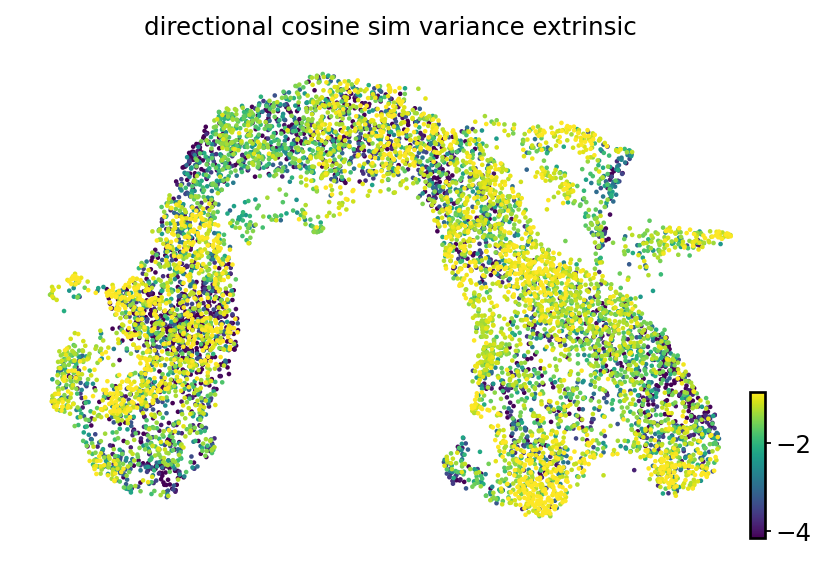

In [35]:
df, _ = _compute_directional_statistics_tensor(extrapolated_cells, n_jobs=4, n_cells=adata.n_obs)

for c in df.columns:
    adata.obs[c + "_extrinsic"] = np.log10(df[c].values)

with mplscience.style_context():
    fig, ax = plt.subplots(figsize=(6, 4))
    scv.pl.umap(adata, color="directional_cosine_sim_variance_extrinsic", perc=[10, 90], cmap="viridis", ax=ax)

    if SAVE_FIGURES:
        path = FIG_DIR / "uncertainty"
        path.mkdir(parents=True, exist_ok=True)
        fig.savefig(
            path / "directional_cosine_sim_variance_extrinsic_snuc_e15.svg",
            format="svg",
            transparent=True,
            bbox_inches="tight",
        )

## Single-cell extrinsic uncertainty

computing velocity graph (using 1/14 cores)


  0%|          | 0/3696 [00:00<?, ?cells/s]

IOPub data rate exceeded.
The Jupyter server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--ServerApp.iopub_data_rate_limit`.

Current values:
ServerApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
ServerApp.rate_limit_window=3.0 (secs)



    finished (0:00:06) --> added 
    'velocities_velovi_0_graph', sparse matrix with cosine correlations (adata.uns)
computing velocity graph (using 1/14 cores)


  0%|          | 0/3696 [00:00<?, ?cells/s]

IOPub data rate exceeded.
The Jupyter server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--ServerApp.iopub_data_rate_limit`.

Current values:
ServerApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
ServerApp.rate_limit_window=3.0 (secs)



    finished (0:00:06) --> added 
    'velocities_velovi_1_graph', sparse matrix with cosine correlations (adata.uns)
computing velocity graph (using 1/14 cores)


  0%|          | 0/3696 [00:00<?, ?cells/s]

IOPub data rate exceeded.
The Jupyter server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--ServerApp.iopub_data_rate_limit`.

Current values:
ServerApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
ServerApp.rate_limit_window=3.0 (secs)



    finished (0:00:06) --> added 
    'velocities_velovi_2_graph', sparse matrix with cosine correlations (adata.uns)
computing velocity graph (using 1/14 cores)


  0%|          | 0/3696 [00:00<?, ?cells/s]

IOPub data rate exceeded.
The Jupyter server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--ServerApp.iopub_data_rate_limit`.

Current values:
ServerApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
ServerApp.rate_limit_window=3.0 (secs)



    finished (0:00:06) --> added 
    'velocities_velovi_3_graph', sparse matrix with cosine correlations (adata.uns)
computing velocity graph (using 1/14 cores)


  0%|          | 0/3696 [00:00<?, ?cells/s]

IOPub data rate exceeded.
The Jupyter server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--ServerApp.iopub_data_rate_limit`.

Current values:
ServerApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
ServerApp.rate_limit_window=3.0 (secs)



    finished (0:00:06) --> added 
    'velocities_velovi_4_graph', sparse matrix with cosine correlations (adata.uns)
computing velocity graph (using 1/14 cores)


  0%|          | 0/3696 [00:00<?, ?cells/s]

IOPub data rate exceeded.
The Jupyter server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--ServerApp.iopub_data_rate_limit`.

Current values:
ServerApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
ServerApp.rate_limit_window=3.0 (secs)



    finished (0:00:06) --> added 
    'velocities_velovi_5_graph', sparse matrix with cosine correlations (adata.uns)
computing velocity graph (using 1/14 cores)


  0%|          | 0/3696 [00:00<?, ?cells/s]

IOPub data rate exceeded.
The Jupyter server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--ServerApp.iopub_data_rate_limit`.

Current values:
ServerApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
ServerApp.rate_limit_window=3.0 (secs)



    finished (0:00:06) --> added 
    'velocities_velovi_6_graph', sparse matrix with cosine correlations (adata.uns)
computing velocity graph (using 1/14 cores)


  0%|          | 0/3696 [00:00<?, ?cells/s]

IOPub data rate exceeded.
The Jupyter server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--ServerApp.iopub_data_rate_limit`.

Current values:
ServerApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
ServerApp.rate_limit_window=3.0 (secs)



    finished (0:00:06) --> added 
    'velocities_velovi_7_graph', sparse matrix with cosine correlations (adata.uns)
computing velocity graph (using 1/14 cores)


  0%|          | 0/3696 [00:00<?, ?cells/s]

IOPub data rate exceeded.
The Jupyter server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--ServerApp.iopub_data_rate_limit`.

Current values:
ServerApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
ServerApp.rate_limit_window=3.0 (secs)



    finished (0:00:06) --> added 
    'velocities_velovi_8_graph', sparse matrix with cosine correlations (adata.uns)
computing velocity graph (using 1/14 cores)


  0%|          | 0/3696 [00:00<?, ?cells/s]

IOPub data rate exceeded.
The Jupyter server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--ServerApp.iopub_data_rate_limit`.

Current values:
ServerApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
ServerApp.rate_limit_window=3.0 (secs)



    finished (0:00:06) --> added 
    'velocities_velovi_9_graph', sparse matrix with cosine correlations (adata.uns)
computing velocity graph (using 1/14 cores)


  0%|          | 0/3696 [00:00<?, ?cells/s]

IOPub data rate exceeded.
The Jupyter server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--ServerApp.iopub_data_rate_limit`.

Current values:
ServerApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
ServerApp.rate_limit_window=3.0 (secs)



    finished (0:00:06) --> added 
    'velocities_velovi_10_graph', sparse matrix with cosine correlations (adata.uns)
computing velocity graph (using 1/14 cores)


  0%|          | 0/3696 [00:00<?, ?cells/s]

IOPub data rate exceeded.
The Jupyter server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--ServerApp.iopub_data_rate_limit`.

Current values:
ServerApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
ServerApp.rate_limit_window=3.0 (secs)



    finished (0:00:06) --> added 
    'velocities_velovi_11_graph', sparse matrix with cosine correlations (adata.uns)
computing velocity graph (using 1/14 cores)


  0%|          | 0/3696 [00:00<?, ?cells/s]

IOPub data rate exceeded.
The Jupyter server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--ServerApp.iopub_data_rate_limit`.

Current values:
ServerApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
ServerApp.rate_limit_window=3.0 (secs)



    finished (0:00:06) --> added 
    'velocities_velovi_12_graph', sparse matrix with cosine correlations (adata.uns)
computing velocity graph (using 1/14 cores)


  0%|          | 0/3696 [00:00<?, ?cells/s]

IOPub data rate exceeded.
The Jupyter server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--ServerApp.iopub_data_rate_limit`.

Current values:
ServerApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
ServerApp.rate_limit_window=3.0 (secs)



    finished (0:00:06) --> added 
    'velocities_velovi_13_graph', sparse matrix with cosine correlations (adata.uns)
computing velocity graph (using 1/14 cores)


  0%|          | 0/3696 [00:00<?, ?cells/s]

IOPub data rate exceeded.
The Jupyter server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--ServerApp.iopub_data_rate_limit`.

Current values:
ServerApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
ServerApp.rate_limit_window=3.0 (secs)



    finished (0:00:06) --> added 
    'velocities_velovi_14_graph', sparse matrix with cosine correlations (adata.uns)
computing velocity graph (using 1/14 cores)


  0%|          | 0/3696 [00:00<?, ?cells/s]

IOPub data rate exceeded.
The Jupyter server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--ServerApp.iopub_data_rate_limit`.

Current values:
ServerApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
ServerApp.rate_limit_window=3.0 (secs)



    finished (0:00:08) --> added 
    'velocities_velovi_15_graph', sparse matrix with cosine correlations (adata.uns)
computing velocity graph (using 1/14 cores)


  0%|          | 0/3696 [00:00<?, ?cells/s]

IOPub data rate exceeded.
The Jupyter server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--ServerApp.iopub_data_rate_limit`.

Current values:
ServerApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
ServerApp.rate_limit_window=3.0 (secs)



    finished (0:00:06) --> added 
    'velocities_velovi_16_graph', sparse matrix with cosine correlations (adata.uns)
computing velocity graph (using 1/14 cores)


  0%|          | 0/3696 [00:00<?, ?cells/s]

IOPub data rate exceeded.
The Jupyter server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--ServerApp.iopub_data_rate_limit`.

Current values:
ServerApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
ServerApp.rate_limit_window=3.0 (secs)



    finished (0:00:06) --> added 
    'velocities_velovi_17_graph', sparse matrix with cosine correlations (adata.uns)
computing velocity graph (using 1/14 cores)


  0%|          | 0/3696 [00:00<?, ?cells/s]

IOPub data rate exceeded.
The Jupyter server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--ServerApp.iopub_data_rate_limit`.

Current values:
ServerApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
ServerApp.rate_limit_window=3.0 (secs)



    finished (0:00:06) --> added 
    'velocities_velovi_18_graph', sparse matrix with cosine correlations (adata.uns)
computing velocity graph (using 1/14 cores)


  0%|          | 0/3696 [00:00<?, ?cells/s]

IOPub data rate exceeded.
The Jupyter server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--ServerApp.iopub_data_rate_limit`.

Current values:
ServerApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
ServerApp.rate_limit_window=3.0 (secs)



    finished (0:00:06) --> added 
    'velocities_velovi_19_graph', sparse matrix with cosine correlations (adata.uns)
computing velocity graph (using 1/14 cores)


  0%|          | 0/3696 [00:00<?, ?cells/s]

IOPub data rate exceeded.
The Jupyter server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--ServerApp.iopub_data_rate_limit`.

Current values:
ServerApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
ServerApp.rate_limit_window=3.0 (secs)



    finished (0:00:06) --> added 
    'velocities_velovi_20_graph', sparse matrix with cosine correlations (adata.uns)
computing velocity graph (using 1/14 cores)


  0%|          | 0/3696 [00:00<?, ?cells/s]

IOPub data rate exceeded.
The Jupyter server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--ServerApp.iopub_data_rate_limit`.

Current values:
ServerApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
ServerApp.rate_limit_window=3.0 (secs)



    finished (0:00:06) --> added 
    'velocities_velovi_21_graph', sparse matrix with cosine correlations (adata.uns)
computing velocity graph (using 1/14 cores)


  0%|          | 0/3696 [00:00<?, ?cells/s]

IOPub data rate exceeded.
The Jupyter server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--ServerApp.iopub_data_rate_limit`.

Current values:
ServerApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
ServerApp.rate_limit_window=3.0 (secs)



    finished (0:00:06) --> added 
    'velocities_velovi_22_graph', sparse matrix with cosine correlations (adata.uns)
computing velocity graph (using 1/14 cores)


  0%|          | 0/3696 [00:00<?, ?cells/s]

IOPub data rate exceeded.
The Jupyter server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--ServerApp.iopub_data_rate_limit`.

Current values:
ServerApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
ServerApp.rate_limit_window=3.0 (secs)



    finished (0:00:06) --> added 
    'velocities_velovi_23_graph', sparse matrix with cosine correlations (adata.uns)
computing velocity graph (using 1/14 cores)


  0%|          | 0/3696 [00:00<?, ?cells/s]

IOPub data rate exceeded.
The Jupyter server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--ServerApp.iopub_data_rate_limit`.

Current values:
ServerApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
ServerApp.rate_limit_window=3.0 (secs)



    finished (0:00:06) --> added 
    'velocities_velovi_24_graph', sparse matrix with cosine correlations (adata.uns)


[Parallel(n_jobs=2)]: Using backend LokyBackend with 2 concurrent workers.
/vol/storage/miniconda3/envs/conda_env_robin/lib/python3.9/site-packages/umap/distances.py:1063: NumbaDeprecationWarning: The 'nopython' keyword argument was not supplied to the 'numba.jit' decorator. The implicit default value for this argument is currently False, but it will be changed to True in Numba 0.59.0. See https://numba.readthedocs.io/en/stable/reference/deprecation.html#deprecation-of-object-mode-fall-back-behaviour-when-using-jit for details.
  @numba.jit()
/vol/storage/miniconda3/envs/conda_env_robin/lib/python3.9/site-packages/umap/distances.py:1071: NumbaDeprecationWarning: The 'nopython' keyword argument was not supplied to the 'numba.jit' decorator. The implicit default value for this argument is currently False, but it will be changed to True in Numba 0.59.0. See https://numba.readthedocs.io/en/stable/reference/deprecation.html#deprecation-of-object-mode-fall-back-behaviour-when-using-jit for d

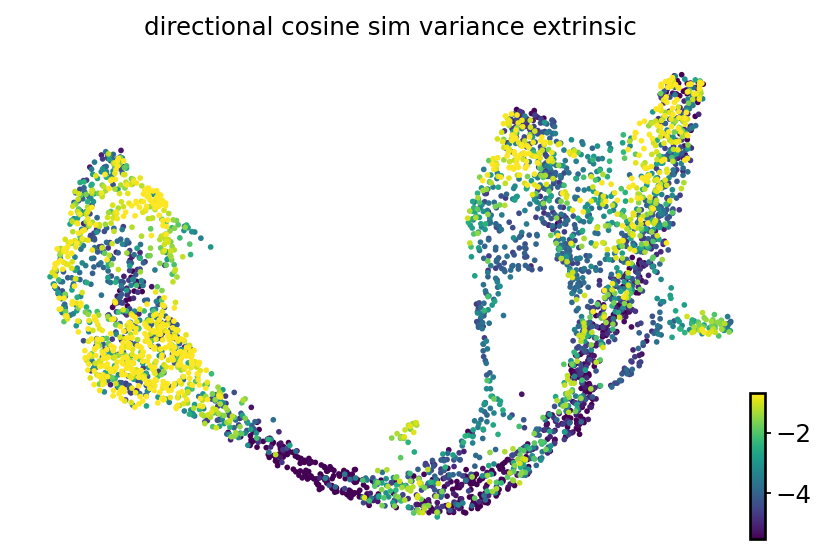

In [36]:
# same for sc
extrapolated_cells_list = []
for i in range(25):
    vkey = f"velocities_velovi_{i}"
    v = vae_sc.get_velocity(n_samples=1, velo_statistic="mean")
    adata_sc.layers[vkey] = v
    scv.tl.velocity_graph(adata_sc, vkey=vkey, sqrt_transform=False, approx=True)
    t_mat = scv.utils.get_transition_matrix(adata_sc, vkey=vkey, self_transitions=True, use_negative_cosines=True)
    extrapolated_cells = np.asarray(t_mat @ adata_sc.layers["Ms"])
    extrapolated_cells_list.append(extrapolated_cells)
extrapolated_cells = np.stack(extrapolated_cells_list)

df, _ = _compute_directional_statistics_tensor(extrapolated_cells, n_jobs=2, n_cells=adata_sc.n_obs)

for c in df.columns:
    adata_sc.obs[c + "_extrinsic"] = np.log10(df[c].values)

with mplscience.style_context():
    fig, ax = plt.subplots(figsize=(6, 4))
    scv.pl.umap(adata_sc, color="directional_cosine_sim_variance_extrinsic", perc=[10, 90], cmap="viridis", ax=ax)

    if SAVE_FIGURES:
        path = FIG_DIR / "uncertainty"
        path.mkdir(parents=True, exist_ok=True)
        fig.savefig(
            path / "directional_cosine_sim_variance_extrinsic_sc_e15.svg",
            format="svg",
            transparent=True,
            bbox_inches="tight",
        )

## Single-nucleus extrinsic uncertainty

computing velocity graph (using 1/14 cores)


  0%|          | 0/4716 [00:00<?, ?cells/s]

IOPub data rate exceeded.
The Jupyter server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--ServerApp.iopub_data_rate_limit`.

Current values:
ServerApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
ServerApp.rate_limit_window=3.0 (secs)



    finished (0:00:08) --> added 
    'velocities_velovi_0_graph', sparse matrix with cosine correlations (adata.uns)
computing velocity graph (using 1/14 cores)


  0%|          | 0/4716 [00:00<?, ?cells/s]

IOPub data rate exceeded.
The Jupyter server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--ServerApp.iopub_data_rate_limit`.

Current values:
ServerApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
ServerApp.rate_limit_window=3.0 (secs)



    finished (0:00:08) --> added 
    'velocities_velovi_1_graph', sparse matrix with cosine correlations (adata.uns)
computing velocity graph (using 1/14 cores)


  0%|          | 0/4716 [00:00<?, ?cells/s]

IOPub data rate exceeded.
The Jupyter server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--ServerApp.iopub_data_rate_limit`.

Current values:
ServerApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
ServerApp.rate_limit_window=3.0 (secs)



    finished (0:00:08) --> added 
    'velocities_velovi_2_graph', sparse matrix with cosine correlations (adata.uns)
computing velocity graph (using 1/14 cores)


  0%|          | 0/4716 [00:00<?, ?cells/s]

IOPub data rate exceeded.
The Jupyter server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--ServerApp.iopub_data_rate_limit`.

Current values:
ServerApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
ServerApp.rate_limit_window=3.0 (secs)



    finished (0:00:08) --> added 
    'velocities_velovi_3_graph', sparse matrix with cosine correlations (adata.uns)
computing velocity graph (using 1/14 cores)


  0%|          | 0/4716 [00:00<?, ?cells/s]

IOPub data rate exceeded.
The Jupyter server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--ServerApp.iopub_data_rate_limit`.

Current values:
ServerApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
ServerApp.rate_limit_window=3.0 (secs)



    finished (0:00:08) --> added 
    'velocities_velovi_4_graph', sparse matrix with cosine correlations (adata.uns)
computing velocity graph (using 1/14 cores)


  0%|          | 0/4716 [00:00<?, ?cells/s]

IOPub data rate exceeded.
The Jupyter server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--ServerApp.iopub_data_rate_limit`.

Current values:
ServerApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
ServerApp.rate_limit_window=3.0 (secs)



    finished (0:00:08) --> added 
    'velocities_velovi_5_graph', sparse matrix with cosine correlations (adata.uns)
computing velocity graph (using 1/14 cores)


  0%|          | 0/4716 [00:00<?, ?cells/s]

IOPub data rate exceeded.
The Jupyter server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--ServerApp.iopub_data_rate_limit`.

Current values:
ServerApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
ServerApp.rate_limit_window=3.0 (secs)



    finished (0:00:08) --> added 
    'velocities_velovi_6_graph', sparse matrix with cosine correlations (adata.uns)
computing velocity graph (using 1/14 cores)


  0%|          | 0/4716 [00:00<?, ?cells/s]

IOPub data rate exceeded.
The Jupyter server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--ServerApp.iopub_data_rate_limit`.

Current values:
ServerApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
ServerApp.rate_limit_window=3.0 (secs)



    finished (0:00:08) --> added 
    'velocities_velovi_7_graph', sparse matrix with cosine correlations (adata.uns)
computing velocity graph (using 1/14 cores)


  0%|          | 0/4716 [00:00<?, ?cells/s]

IOPub data rate exceeded.
The Jupyter server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--ServerApp.iopub_data_rate_limit`.

Current values:
ServerApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
ServerApp.rate_limit_window=3.0 (secs)



    finished (0:00:08) --> added 
    'velocities_velovi_8_graph', sparse matrix with cosine correlations (adata.uns)
computing velocity graph (using 1/14 cores)


  0%|          | 0/4716 [00:00<?, ?cells/s]

IOPub data rate exceeded.
The Jupyter server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--ServerApp.iopub_data_rate_limit`.

Current values:
ServerApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
ServerApp.rate_limit_window=3.0 (secs)



    finished (0:00:08) --> added 
    'velocities_velovi_9_graph', sparse matrix with cosine correlations (adata.uns)
computing velocity graph (using 1/14 cores)


  0%|          | 0/4716 [00:00<?, ?cells/s]

IOPub data rate exceeded.
The Jupyter server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--ServerApp.iopub_data_rate_limit`.

Current values:
ServerApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
ServerApp.rate_limit_window=3.0 (secs)



    finished (0:00:08) --> added 
    'velocities_velovi_10_graph', sparse matrix with cosine correlations (adata.uns)
computing velocity graph (using 1/14 cores)


  0%|          | 0/4716 [00:00<?, ?cells/s]

IOPub data rate exceeded.
The Jupyter server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--ServerApp.iopub_data_rate_limit`.

Current values:
ServerApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
ServerApp.rate_limit_window=3.0 (secs)



    finished (0:00:08) --> added 
    'velocities_velovi_11_graph', sparse matrix with cosine correlations (adata.uns)
computing velocity graph (using 1/14 cores)


  0%|          | 0/4716 [00:00<?, ?cells/s]

IOPub data rate exceeded.
The Jupyter server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--ServerApp.iopub_data_rate_limit`.

Current values:
ServerApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
ServerApp.rate_limit_window=3.0 (secs)



    finished (0:00:08) --> added 
    'velocities_velovi_12_graph', sparse matrix with cosine correlations (adata.uns)
computing velocity graph (using 1/14 cores)


  0%|          | 0/4716 [00:00<?, ?cells/s]

IOPub data rate exceeded.
The Jupyter server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--ServerApp.iopub_data_rate_limit`.

Current values:
ServerApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
ServerApp.rate_limit_window=3.0 (secs)



    finished (0:00:08) --> added 
    'velocities_velovi_13_graph', sparse matrix with cosine correlations (adata.uns)
computing velocity graph (using 1/14 cores)


  0%|          | 0/4716 [00:00<?, ?cells/s]

IOPub data rate exceeded.
The Jupyter server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--ServerApp.iopub_data_rate_limit`.

Current values:
ServerApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
ServerApp.rate_limit_window=3.0 (secs)



    finished (0:00:08) --> added 
    'velocities_velovi_14_graph', sparse matrix with cosine correlations (adata.uns)
computing velocity graph (using 1/14 cores)


  0%|          | 0/4716 [00:00<?, ?cells/s]

IOPub data rate exceeded.
The Jupyter server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--ServerApp.iopub_data_rate_limit`.

Current values:
ServerApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
ServerApp.rate_limit_window=3.0 (secs)



    finished (0:00:08) --> added 
    'velocities_velovi_15_graph', sparse matrix with cosine correlations (adata.uns)
computing velocity graph (using 1/14 cores)


  0%|          | 0/4716 [00:00<?, ?cells/s]

IOPub data rate exceeded.
The Jupyter server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--ServerApp.iopub_data_rate_limit`.

Current values:
ServerApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
ServerApp.rate_limit_window=3.0 (secs)



    finished (0:00:08) --> added 
    'velocities_velovi_16_graph', sparse matrix with cosine correlations (adata.uns)
computing velocity graph (using 1/14 cores)


  0%|          | 0/4716 [00:00<?, ?cells/s]

IOPub data rate exceeded.
The Jupyter server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--ServerApp.iopub_data_rate_limit`.

Current values:
ServerApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
ServerApp.rate_limit_window=3.0 (secs)



    finished (0:00:08) --> added 
    'velocities_velovi_17_graph', sparse matrix with cosine correlations (adata.uns)
computing velocity graph (using 1/14 cores)


  0%|          | 0/4716 [00:00<?, ?cells/s]

IOPub data rate exceeded.
The Jupyter server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--ServerApp.iopub_data_rate_limit`.

Current values:
ServerApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
ServerApp.rate_limit_window=3.0 (secs)



    finished (0:00:08) --> added 
    'velocities_velovi_18_graph', sparse matrix with cosine correlations (adata.uns)
computing velocity graph (using 1/14 cores)


  0%|          | 0/4716 [00:00<?, ?cells/s]

IOPub data rate exceeded.
The Jupyter server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--ServerApp.iopub_data_rate_limit`.

Current values:
ServerApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
ServerApp.rate_limit_window=3.0 (secs)



    finished (0:00:08) --> added 
    'velocities_velovi_19_graph', sparse matrix with cosine correlations (adata.uns)
computing velocity graph (using 1/14 cores)


  0%|          | 0/4716 [00:00<?, ?cells/s]

IOPub data rate exceeded.
The Jupyter server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--ServerApp.iopub_data_rate_limit`.

Current values:
ServerApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
ServerApp.rate_limit_window=3.0 (secs)



    finished (0:00:08) --> added 
    'velocities_velovi_20_graph', sparse matrix with cosine correlations (adata.uns)
computing velocity graph (using 1/14 cores)


  0%|          | 0/4716 [00:00<?, ?cells/s]

IOPub data rate exceeded.
The Jupyter server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--ServerApp.iopub_data_rate_limit`.

Current values:
ServerApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
ServerApp.rate_limit_window=3.0 (secs)



    finished (0:00:08) --> added 
    'velocities_velovi_21_graph', sparse matrix with cosine correlations (adata.uns)
computing velocity graph (using 1/14 cores)


  0%|          | 0/4716 [00:00<?, ?cells/s]

IOPub data rate exceeded.
The Jupyter server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--ServerApp.iopub_data_rate_limit`.

Current values:
ServerApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
ServerApp.rate_limit_window=3.0 (secs)



    finished (0:00:08) --> added 
    'velocities_velovi_22_graph', sparse matrix with cosine correlations (adata.uns)
computing velocity graph (using 1/14 cores)


  0%|          | 0/4716 [00:00<?, ?cells/s]

IOPub data rate exceeded.
The Jupyter server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--ServerApp.iopub_data_rate_limit`.

Current values:
ServerApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
ServerApp.rate_limit_window=3.0 (secs)



    finished (0:00:08) --> added 
    'velocities_velovi_23_graph', sparse matrix with cosine correlations (adata.uns)
computing velocity graph (using 1/14 cores)


  0%|          | 0/4716 [00:00<?, ?cells/s]

IOPub data rate exceeded.
The Jupyter server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--ServerApp.iopub_data_rate_limit`.

Current values:
ServerApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
ServerApp.rate_limit_window=3.0 (secs)



    finished (0:00:08) --> added 
    'velocities_velovi_24_graph', sparse matrix with cosine correlations (adata.uns)


[Parallel(n_jobs=2)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=2)]: Done 444 tasks      | elapsed:    0.9s
[Parallel(n_jobs=2)]: Done 4716 out of 4716 | elapsed:    6.3s finished


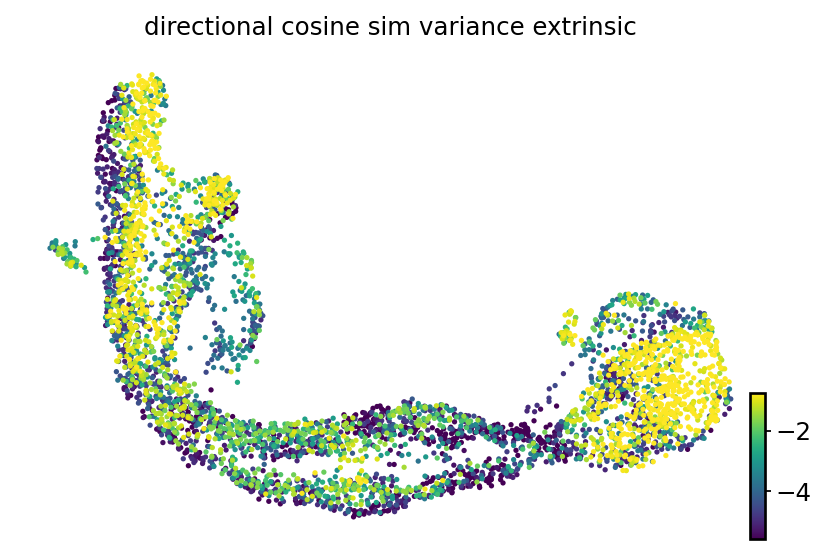

In [37]:
# same for sn
extrapolated_cells_list = []
for i in range(25):
    vkey = f"velocities_velovi_{i}"
    v = vae_sn.get_velocity(n_samples=1, velo_statistic="mean")
    adata_sn.layers[vkey] = v
    scv.tl.velocity_graph(adata_sn, vkey=vkey, sqrt_transform=False, approx=True)
    t_mat = scv.utils.get_transition_matrix(adata_sn, vkey=vkey, self_transitions=True, use_negative_cosines=True)
    extrapolated_cells = np.asarray(t_mat @ adata_sn.layers["Ms"])
    extrapolated_cells_list.append(extrapolated_cells)
extrapolated_cells = np.stack(extrapolated_cells_list)

df, _ = _compute_directional_statistics_tensor(extrapolated_cells, n_jobs=2, n_cells=adata_sn.n_obs)

for c in df.columns:
    adata_sn.obs[c + "_extrinsic"] = np.log10(df[c].values)

with mplscience.style_context():
    fig, ax = plt.subplots(figsize=(6, 4))
    scv.pl.umap(adata_sn, color="directional_cosine_sim_variance_extrinsic", perc=[10, 90], cmap="viridis", ax=ax)

    if SAVE_FIGURES:
        path = FIG_DIR / "uncertainty"
        path.mkdir(parents=True, exist_ok=True)
        fig.savefig(
            path / "directional_cosine_sim_variance_extrinsic_sn_e15.svg",
            format="svg",
            transparent=True,
            bbox_inches="tight",
        )

## Compare scale of uncertainties

In [38]:
uncertainty_df = pd.DataFrame()
nuc_cyt_in = adata.obs["directional_cosine_sim_variance"].tolist()
sc_in = adata_sc.obs["directional_cosine_sim_variance"].tolist()
sn_in = adata_sn.obs["directional_cosine_sim_variance"].tolist()

nuc_cyt_ex = adata.obs["directional_cosine_sim_variance_extrinsic"].tolist()
sc_ex = adata_sc.obs["directional_cosine_sim_variance_extrinsic"].tolist()
sn_ex = adata_sn.obs["directional_cosine_sim_variance_extrinsic"].tolist()


uncertainty_df["uncertainty_intrinsic"] = nuc_cyt_in + sc_in + sn_in
uncertainty_df["uncertainty_extrinsic"] = nuc_cyt_ex + sc_ex + sn_ex
uncertainty_df["log_uncertainty_extrinsic"] = -np.log10(np.abs(uncertainty_df["uncertainty_extrinsic"]))
uncertainty_df["Model"] = ["Nuc/Cyt model"] * len(nuc_cyt_in) + ["sc-model"] * len(sc_in) + ["sn-model"] * len(sn_in)

palette = dict(zip(["Nuc/Cyt model", "sc-model", "sn-model"], sns.color_palette("colorblind").as_hex()[:3]))

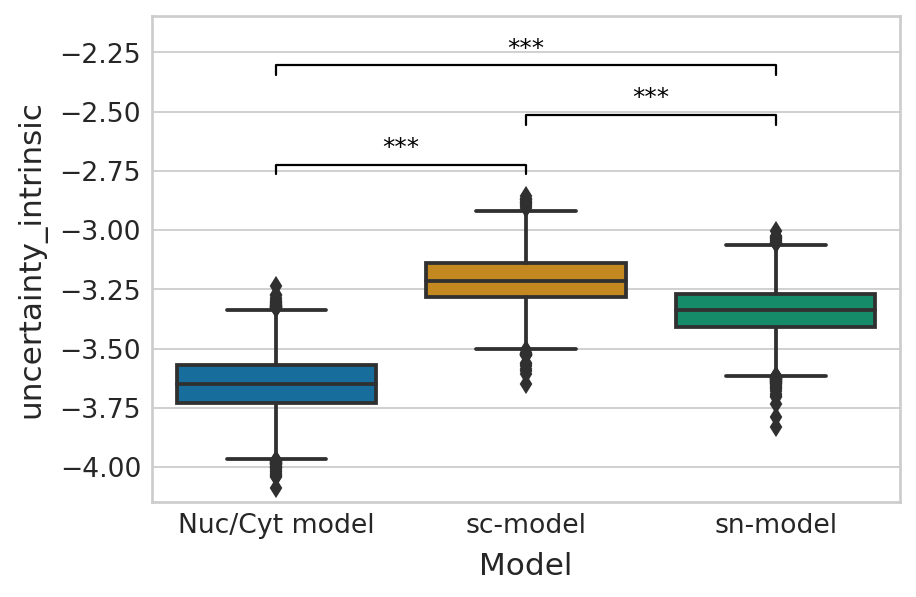

In [39]:
with mplscience.style_context():
    sns.set_style(style="whitegrid")
    fig, ax = plt.subplots(figsize=(6, 4))

    sns.boxplot(data=uncertainty_df, x="Model", y="uncertainty_intrinsic", palette=palette, ax=ax)
    y_min, y_max = ax.get_ylim()
    ax.set_ylim([y_min, y_max + 0.7])

    # sc vs nuc cyt
    ttest_res = ttest_ind(
        uncertainty_df.loc[uncertainty_df.Model == "Nuc/Cyt model", "uncertainty_intrinsic"],
        uncertainty_df.loc[uncertainty_df.Model == "sc-model", "uncertainty_intrinsic"],
        equal_var=False,
        alternative="two-sided",
    )
    significance = _get_significance(ttest_res.pvalue)
    _add_significance(
        ax=ax,
        left=0,
        right=1,
        significance=significance,
        lw=1,
        bracket_level=1.3,
        c="k",
        level=0,
    )

    # sc vs sn
    ttest_res = ttest_ind(
        uncertainty_df.loc[uncertainty_df.Model == "sc-model", "uncertainty_intrinsic"],
        uncertainty_df.loc[uncertainty_df.Model == "sn-model", "uncertainty_intrinsic"],
        equal_var=False,
        alternative="two-sided",
    )

    significance = _get_significance(ttest_res.pvalue)
    _add_significance(
        ax=ax,
        left=1,
        right=2,
        significance=significance,
        lw=1,
        bracket_level=1.2,
        c="k",
        level=0,
    )

    # nuc cyt vs sn
    ttest_res = ttest_ind(
        uncertainty_df.loc[uncertainty_df.Model == "Nuc/Cyt model", "uncertainty_intrinsic"],
        uncertainty_df.loc[uncertainty_df.Model == "sn-model", "uncertainty_intrinsic"],
        equal_var=False,
        alternative="two-sided",
    )
    significance = _get_significance(ttest_res.pvalue)
    _add_significance(
        ax=ax,
        left=0,
        right=2,
        significance=significance,
        lw=1,
        bracket_level=1.1,
        c="k",
        level=0,
    )
    plt.show()
    if SAVE_FIGURES:
        path = FIG_DIR / "uncertainty"
        if not os.path.exists(path):
            path.mkdir()
        fig.savefig(path / "intrinsic_uncertainty_compare_e15.svg", format="svg", transparent=True, bbox_inches="tight")

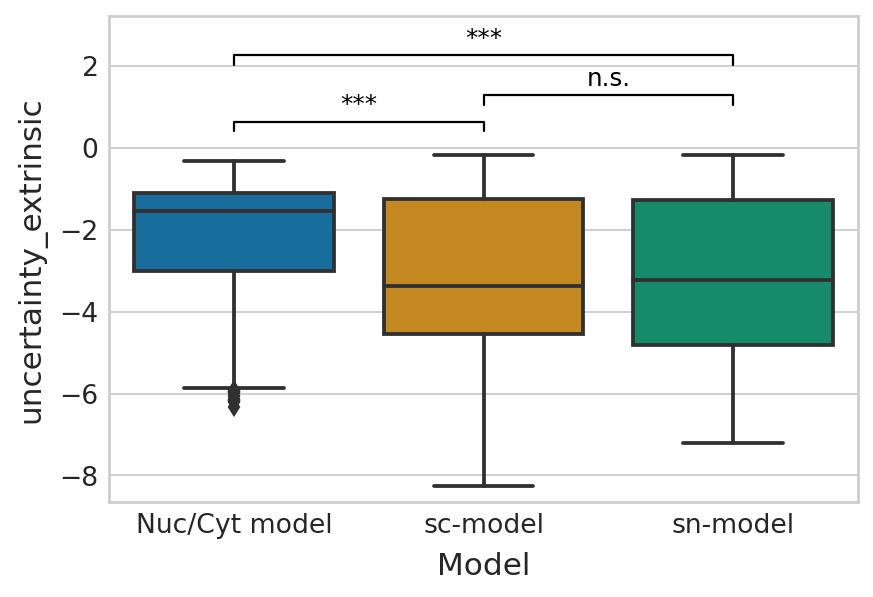

In [40]:
with mplscience.style_context():
    sns.set_style(style="whitegrid")
    fig, ax = plt.subplots(figsize=(6, 4))
    sns.boxplot(data=uncertainty_df, x="Model", y="uncertainty_extrinsic", palette=palette, ax=ax)
    y_min, y_max = ax.get_ylim()
    ax.set_ylim([y_min, y_max + 3])

    # sc vs nuc cyt
    ttest_res = ttest_ind(
        uncertainty_df.loc[uncertainty_df.Model == "Nuc/Cyt model", "uncertainty_extrinsic"],
        uncertainty_df.loc[uncertainty_df.Model == "sc-model", "uncertainty_extrinsic"],
        equal_var=False,
        alternative="two-sided",
    )
    significance = _get_significance(ttest_res.pvalue)
    _add_significance(
        ax=ax,
        left=0,
        right=1,
        significance=significance,
        lw=1,
        bracket_level=0.2,
        c="k",
        level=0,
    )

    # sc vs sn
    ttest_res = ttest_ind(
        uncertainty_df.loc[uncertainty_df.Model == "sc-model", "uncertainty_extrinsic"],
        uncertainty_df.loc[uncertainty_df.Model == "sn-model", "uncertainty_extrinsic"],
        equal_var=False,
        alternative="two-sided",
    )

    significance = _get_significance(ttest_res.pvalue)
    _add_significance(
        ax=ax,
        left=1,
        right=2,
        significance=significance,
        lw=1,
        bracket_level=0.4,
        c="k",
        level=0,
    )

    # nuc cyt vs sn
    ttest_res = ttest_ind(
        uncertainty_df.loc[uncertainty_df.Model == "Nuc/Cyt model", "uncertainty_extrinsic"],
        uncertainty_df.loc[uncertainty_df.Model == "sn-model", "uncertainty_extrinsic"],
        equal_var=False,
        alternative="two-sided",
    )
    significance = _get_significance(ttest_res.pvalue)
    _add_significance(
        ax=ax,
        left=0,
        right=2,
        significance=significance,
        lw=1,
        bracket_level=0.7,
        c="k",
        level=0,
    )
    plt.show()

    if SAVE_FIGURES:
        path = FIG_DIR / "uncertainty"
        if not os.path.exists(path):
            path.mkdir()
        fig.savefig(path / "extrinsic_uncertainty_compare_e15.svg", format="svg", transparent=True, bbox_inches="tight")

## Calculate Pseudotimes and plot against fate probabilities colored by uncertainties

#### 1. compute velocity kernel induced cell-cell transition matrix

  0%|          | 0/8403 [00:00<?, ?cell/s]

  0%|          | 0/8403 [00:00<?, ?cell/s]

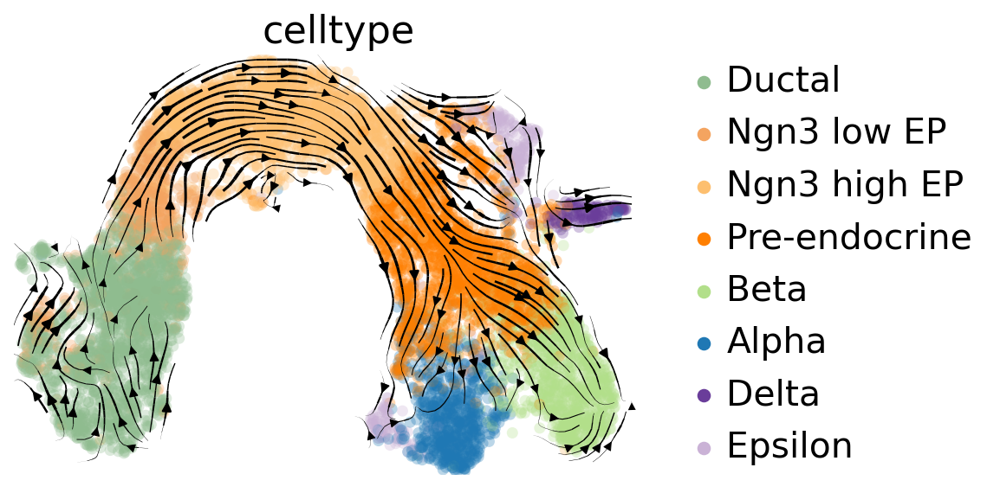

In [21]:
vk = cr.kernels.VelocityKernel(adata, vkey="velocities_velovi_s_sum", xkey="Ms_sum")
vk.compute_transition_matrix()

vk.plot_projection(color="celltype", legend_loc="right margin")

vk.write_to_adata()

  0%|          | 0/8403 [00:00<?, ?cell/s]

  0%|          | 0/8403 [00:00<?, ?cell/s]

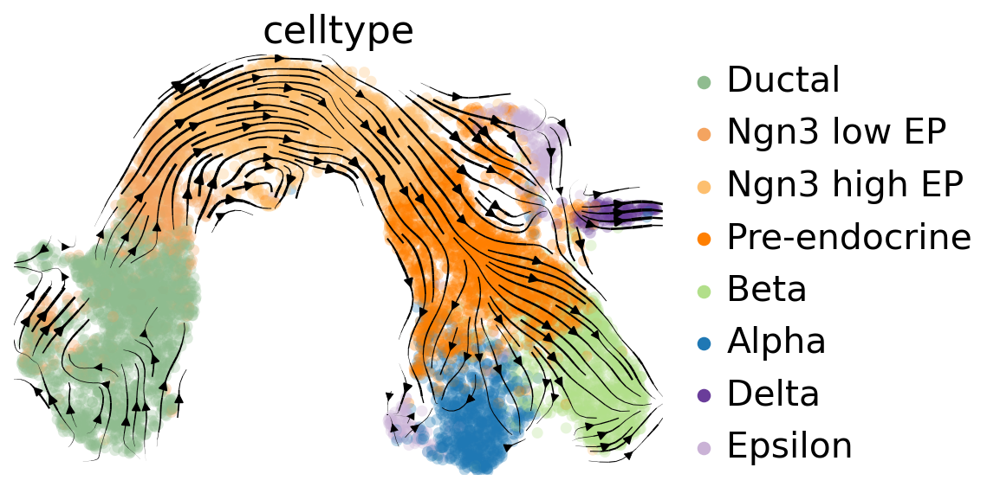

In [76]:
# vk = cr.kernels.VelocityKernel(adata, vkey="velocities_velovi_s_nuc", xkey="Ms_nuc")
# vk.compute_transition_matrix()

# vk.plot_projection(color="celltype", legend_loc="right margin")

# vk.write_to_adata()

  0%|          | 0/3696 [00:00<?, ?cell/s]

  0%|          | 0/3696 [00:00<?, ?cell/s]

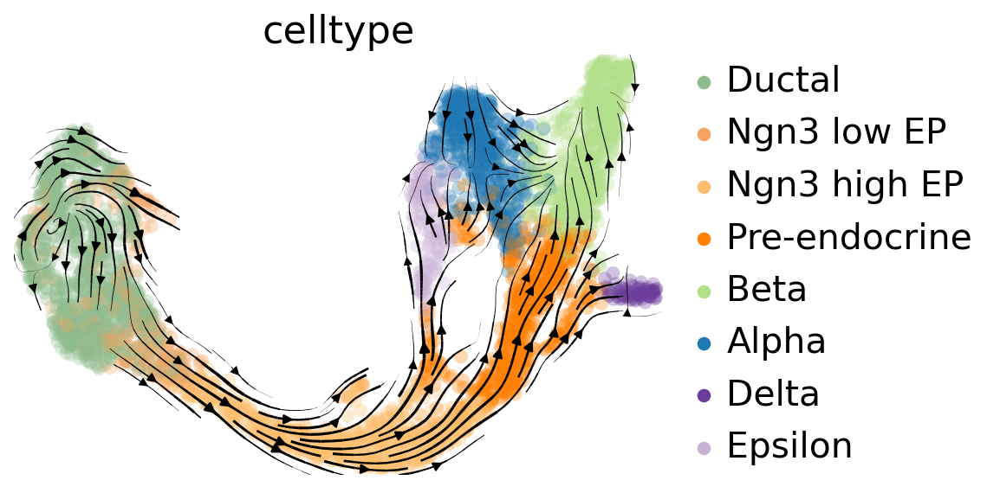

In [42]:
vk = cr.kernels.VelocityKernel(adata_sc, vkey="velocities_velovi", xkey="Ms")
vk.compute_transition_matrix()

vk.plot_projection(color="celltype", legend_loc="right margin")

vk.write_to_adata()

  0%|          | 0/4716 [00:00<?, ?cell/s]

  0%|          | 0/4716 [00:00<?, ?cell/s]

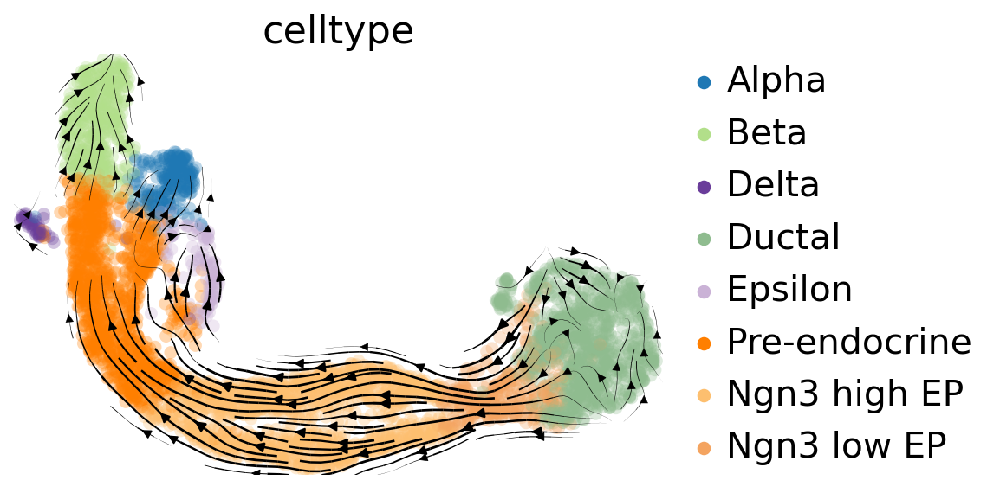

In [43]:
vk = cr.kernels.VelocityKernel(adata_sn, vkey="velocities_velovi", xkey="Ms")
vk.compute_transition_matrix()

vk.plot_projection(color="celltype", legend_loc="right margin")

vk.write_to_adata()

##### Follow steps from cellranks tutorial

GPCCA[kernel=VelocityKernel[n=3696], initial_states=None, terminal_states=None]


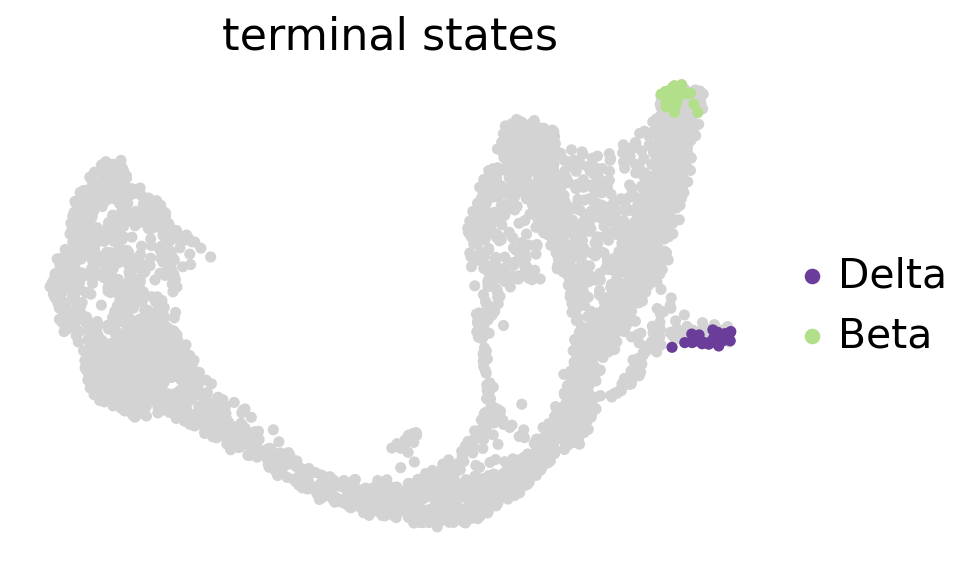

Defaulting to `'gmres'` solver.


  0%|          | 0/2 [00:00<?, ?/s]

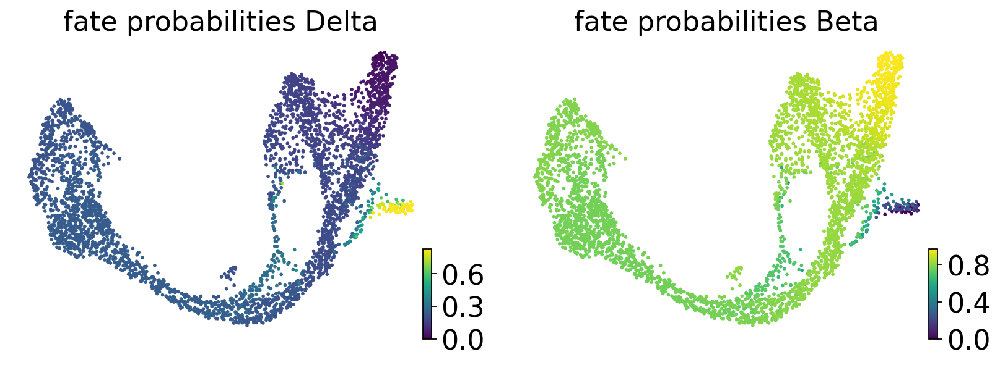

In [48]:
# single-cell
vk = cr.kernels.VelocityKernel.from_adata(adata_sc, key="T_fwd")

g = cr.estimators.GPCCA(vk)
print(g)

g.fit(cluster_key="celltype", n_states=[4, 12])

# g.set_terminal_states(states=["Alpha", "Beta"])
g.set_terminal_states(states=["Delta", "Beta"])
g.plot_macrostates(which="terminal", legend_loc="right", size=100)

g.compute_fate_probabilities()
g.plot_fate_probabilities(same_plot=False)

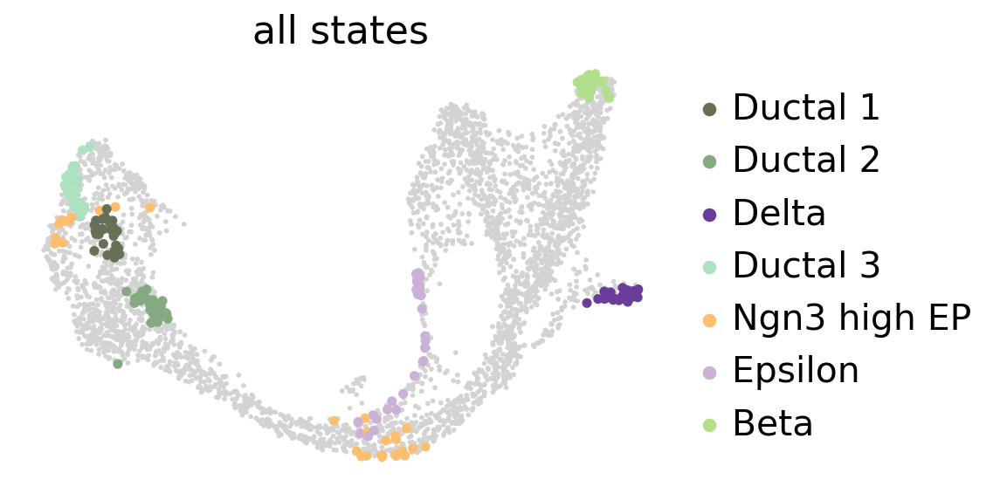

In [49]:
g.plot_macrostates(which="all", discrete=True, legend_loc="right", s=100)

computing terminal states
    identified 1 region of root cells and 1 region of end points .
    finished (0:00:00) --> added
    'root_cells', root cells of Markov diffusion process (adata.obs)
    'end_points', end points of Markov diffusion process (adata.obs)


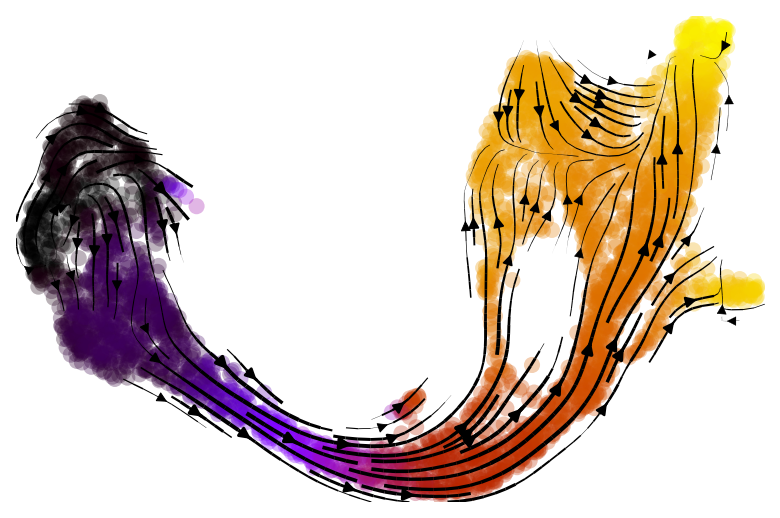

In [50]:
# calculate pseudotime
scv.tl.velocity_pseudotime(adata_sc, vkey="velocities_velovi")

with mplscience.style_context():
    fig, ax = plt.subplots(figsize=(6, 4))
    scv.pl.velocity_embedding_stream(
        adata_sc,
        vkey="velocities_velovi",
        color="velocities_velovi_pseudotime",
        color_map="gnuplot",
        ax=ax,
        title="",
        legend_loc=False,
        colorbar=False,
    )
    if SAVE_FIGURES:
        path = FIG_DIR / "uncertainty"
        path.mkdir(parents=True, exist_ok=True)
        fig.savefig(
            path / "pseudtime_umap_velo_stream_sc_e15.png", format="png", dpi=700, transparent=True, bbox_inches="tight"
        )
        fig.savefig(path / "pseudtime_umap_velo_stream_sc_e15.svg", format="svg", transparent=True, bbox_inches="tight")

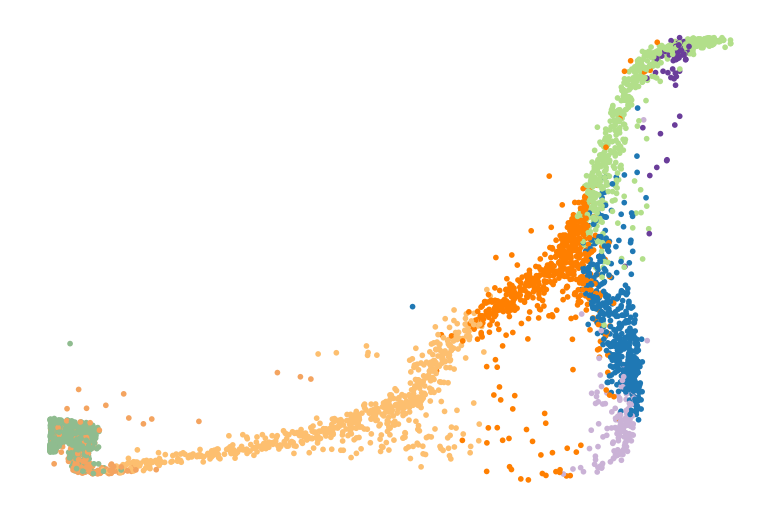

In [51]:
with mplscience.style_context():
    fig, ax = plt.subplots(figsize=(6, 4))
    ax.axis("off")
    scv.pl.scatter(
        adata_sc,
        x=adata_sc.obs["velocities_velovi_pseudotime"],
        y=adata_sc.obs["term_states_fwd_probs"],
        color="celltype",
        ax=ax,
        title="",
        legend_loc=False,
        colorbar=False,
    )

    if SAVE_FIGURES:
        path = FIG_DIR / "uncertainty"
        path.mkdir(parents=True, exist_ok=True)
        fig.savefig(
            path / "pseudotime_fate_prob_celltype_sc_e15.svg", format="svg", transparent=True, bbox_inches="tight"
        )
        fig.savefig(
            path / "pseudotime_fate_prob_celltype_sc_e15.png",
            format="png",
            dpi=700,
            transparent=True,
            bbox_inches="tight",
        )

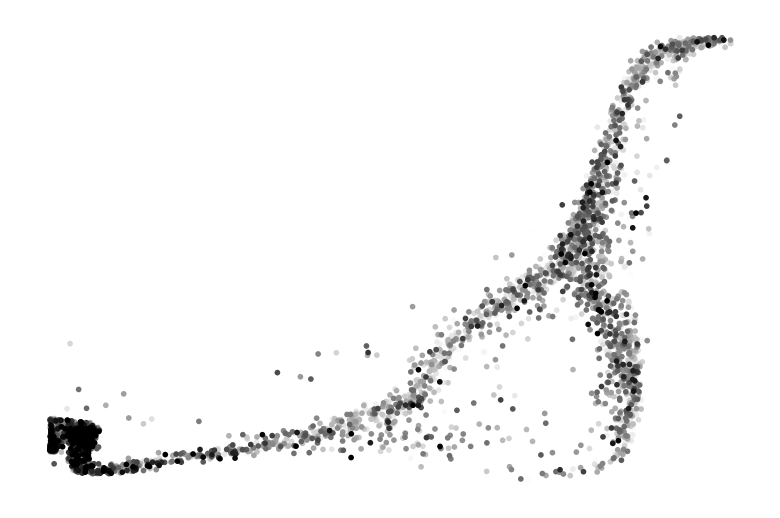

In [52]:
with mplscience.style_context():
    fig, ax = plt.subplots(figsize=(6, 4))
    ax.axis("off")
    scv.pl.scatter(
        adata_sc,
        x=adata_sc.obs["velocities_velovi_pseudotime"],
        y=adata_sc.obs["term_states_fwd_probs"],
        color="directional_cosine_sim_variance",
        perc=[5, 95],
        cmap="Greys",
        ax=ax,
        title="",
        legend_loc=False,
        colorbar=False,
    )

    if SAVE_FIGURES:
        path = FIG_DIR / "uncertainty"
        path.mkdir(parents=True, exist_ok=True)
        fig.savefig(
            path / "pseudotime_fate_prob_intrinsic_sc_e15.svg", format="svg", transparent=True, bbox_inches="tight"
        )
        fig.savefig(
            path / "pseudotime_fate_prob_intrinsic_sc_e15.png",
            format="png",
            dpi=700,
            transparent=True,
            bbox_inches="tight",
        )

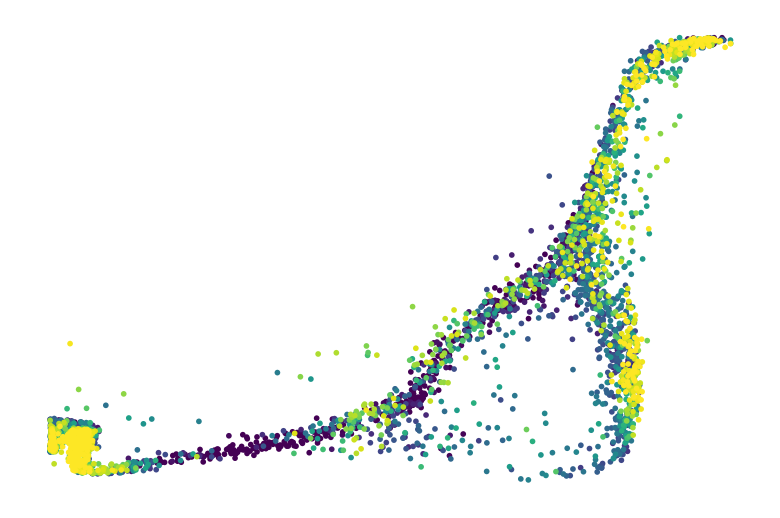

In [53]:
with mplscience.style_context():
    fig, ax = plt.subplots(figsize=(6, 4))
    ax.axis("off")
    scv.pl.scatter(
        adata_sc,
        x=adata_sc.obs["velocities_velovi_pseudotime"],
        y=adata_sc.obs["term_states_fwd_probs"],
        color="directional_cosine_sim_variance_extrinsic",
        perc=[10, 90],
        cmap="viridis",
        ax=ax,
        title="",
        legend_loc=False,
        colorbar=False,
    )

    if SAVE_FIGURES:
        path = FIG_DIR / "uncertainty"
        path.mkdir(parents=True, exist_ok=True)
        fig.savefig(
            path / "pseudotime_fate_prob_extrinsic_sc_e15.svg", format="svg", transparent=True, bbox_inches="tight"
        )
        fig.savefig(
            path / "pseudotime_fate_prob_extrinsic_sc_e15.png",
            format="png",
            dpi=700,
            transparent=True,
            bbox_inches="tight",
        )

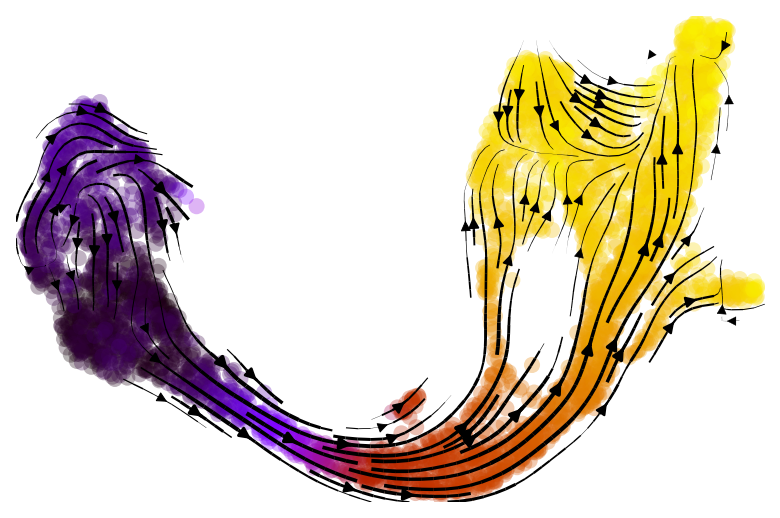

In [54]:
adata_sc.uns["iroot"] = np.flatnonzero(adata_sc.obs["celltype"] == "Ductal")[0]
sc.tl.dpt(adata_sc)

with mplscience.style_context():
    fig, ax = plt.subplots(figsize=(6, 4))
    scv.pl.velocity_embedding_stream(
        adata_sc,
        vkey="velocities_velovi",
        color="dpt_pseudotime",
        color_map="gnuplot",
        ax=ax,
        title="",
        legend_loc=False,
        colorbar=False,
    )
    if SAVE_FIGURES:
        path = FIG_DIR / "uncertainty"
        path.mkdir(parents=True, exist_ok=True)
        fig.savefig(
            path / "pseudtime_umap_velo_stream_sc_dpt_e15.png",
            format="png",
            dpi=700,
            transparent=True,
            bbox_inches="tight",
        )
        fig.savefig(
            path / "pseudtime_umap_velo_stream_sc_dpt_e15.svg", format="svg", transparent=True, bbox_inches="tight"
        )

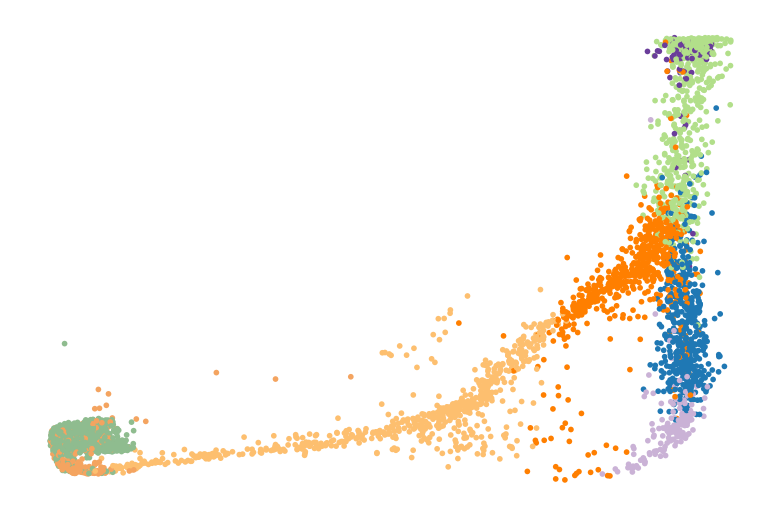

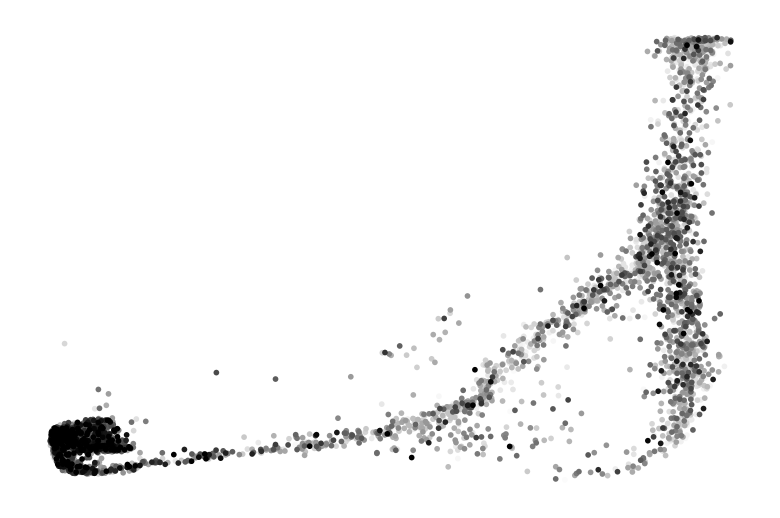

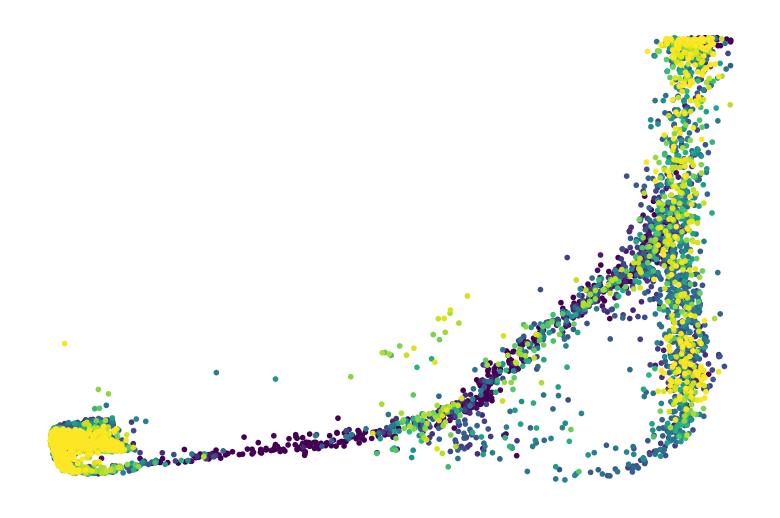

In [55]:
## now for dpt pseudotime
with mplscience.style_context():
    fig, ax = plt.subplots(figsize=(6, 4))
    ax.axis("off")
    scv.pl.scatter(
        adata_sc,
        x=adata_sc.obs["dpt_pseudotime"],
        y=adata_sc.obs["term_states_fwd_probs"],
        color="celltype",
        ax=ax,
        title="",
        legend_loc=False,
        colorbar=False,
    )

    if SAVE_FIGURES:
        path = FIG_DIR / "uncertainty"
        path.mkdir(parents=True, exist_ok=True)
        fig.savefig(
            path / "pseudotime_fate_prob_celltype_sc_dpt_e15.svg", format="svg", transparent=True, bbox_inches="tight"
        )
        fig.savefig(
            path / "pseudotime_fate_prob_celltype_sc_dpt_e15.png",
            format="png",
            dpi=700,
            transparent=True,
            bbox_inches="tight",
        )


with mplscience.style_context():
    fig, ax = plt.subplots(figsize=(6, 4))
    ax.axis("off")
    scv.pl.scatter(
        adata_sc,
        x=adata_sc.obs["dpt_pseudotime"],
        y=adata_sc.obs["term_states_fwd_probs"],
        color="directional_cosine_sim_variance",
        perc=[5, 95],
        cmap="Greys",
        ax=ax,
        title="",
        legend_loc=False,
        colorbar=False,
    )

    if SAVE_FIGURES:
        path = FIG_DIR / "uncertainty"
        path.mkdir(parents=True, exist_ok=True)
        fig.savefig(
            path / "pseudotime_fate_prob_intrinsic_sc_dpt.svg", format="svg", transparent=True, bbox_inches="tight"
        )
        fig.savefig(
            path / "pseudotime_fate_prob_intrinsic_sc_dpt_e15.png",
            format="png",
            dpi=700,
            transparent=True,
            bbox_inches="tight",
        )

with mplscience.style_context():
    fig, ax = plt.subplots(figsize=(6, 4))
    ax.axis("off")
    scv.pl.scatter(
        adata_sc,
        x=adata_sc.obs["dpt_pseudotime"],
        y=adata_sc.obs["term_states_fwd_probs"],
        color="directional_cosine_sim_variance_extrinsic",
        perc=[10, 90],
        cmap="viridis",
        ax=ax,
        title="",
        legend_loc=False,
        colorbar=False,
    )

    if SAVE_FIGURES:
        path = FIG_DIR / "uncertainty"
        path.mkdir(parents=True, exist_ok=True)
        fig.savefig(
            path / "pseudotime_fate_prob_extrinsic_sc_dpt_e15.svg", format="svg", transparent=True, bbox_inches="tight"
        )
        fig.savefig(
            path / "pseudotime_fate_prob_extrinsic_sc_dpt_e15.png",
            format="png",
            dpi=700,
            transparent=True,
            bbox_inches="tight",
        )

### Same for single-nucleus

GPCCA[kernel=VelocityKernel[n=4716], initial_states=None, terminal_states=None]


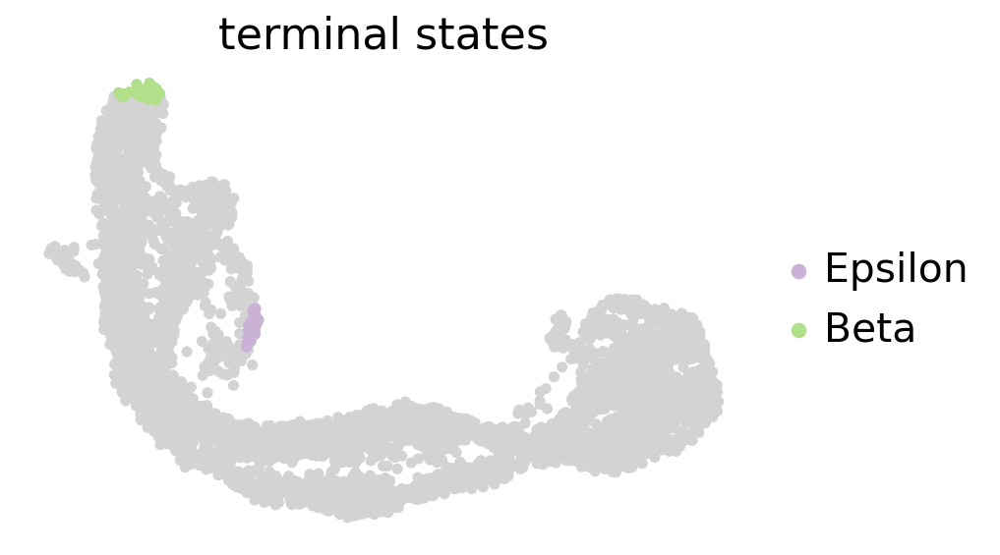

  0%|          | 0/2 [00:00<?, ?/s]

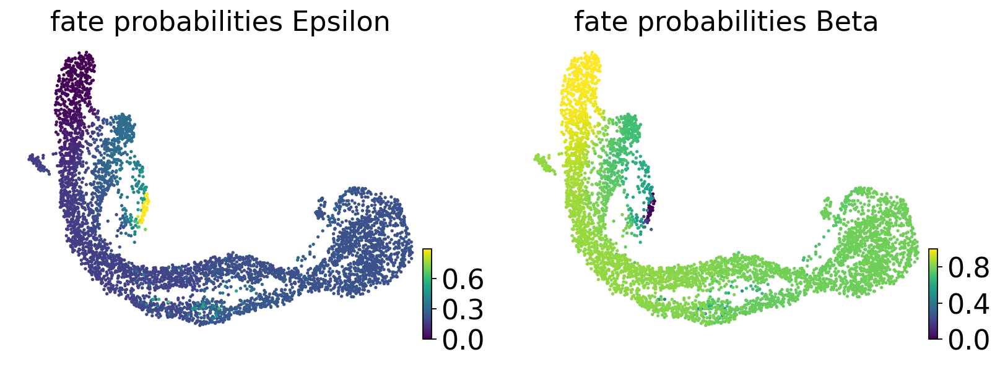

In [57]:
# single-nucleus
vk = cr.kernels.VelocityKernel.from_adata(adata_sn, key="T_fwd")

g = cr.estimators.GPCCA(vk)
print(g)

g.fit(cluster_key="celltype", n_states=[4, 12])

# does not infer epsilon, delta as in tutorial
# g.set_terminal_states(states=["Alpha", "Beta"])
g.set_terminal_states(states=["Epsilon", "Beta"])
g.plot_macrostates(which="terminal", legend_loc="right", size=100)

g.compute_fate_probabilities()
g.plot_fate_probabilities(same_plot=False)

computing terminal states
    identified 1 region of root cells and 1 region of end points .
    finished (0:00:00) --> added
    'root_cells', root cells of Markov diffusion process (adata.obs)
    'end_points', end points of Markov diffusion process (adata.obs)


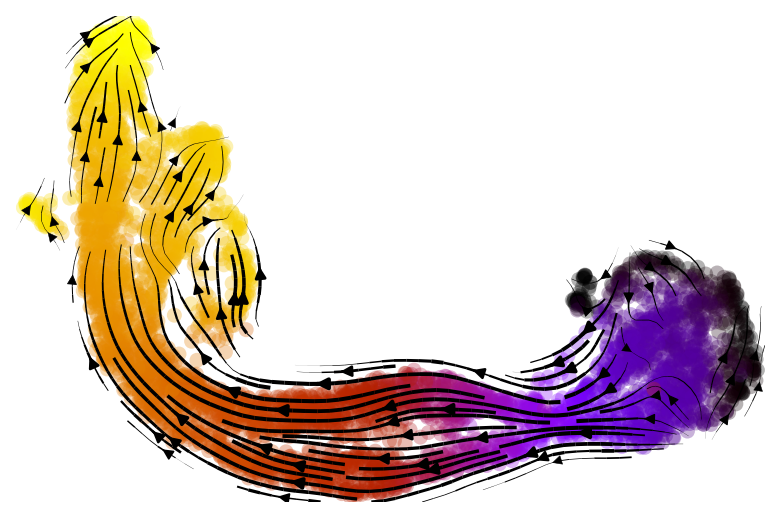

In [58]:
# calculate pseudotime
scv.tl.velocity_pseudotime(adata_sn, vkey="velocities_velovi")

with mplscience.style_context():
    fig, ax = plt.subplots(figsize=(6, 4))
    scv.pl.velocity_embedding_stream(
        adata_sn,
        vkey="velocities_velovi",
        color="velocities_velovi_pseudotime",
        color_map="gnuplot",
        ax=ax,
        title="",
        legend_loc=False,
        colorbar=False,
    )
    if SAVE_FIGURES:
        path = FIG_DIR / "uncertainty"
        path.mkdir(parents=True, exist_ok=True)
        fig.savefig(
            path / "pseudtime_umap_velo_stream_sn.png", format="png", dpi=700, transparent=True, bbox_inches="tight"
        )
        fig.savefig(path / "pseudtime_umap_velo_stream_sn.svg", format="svg", transparent=True, bbox_inches="tight")

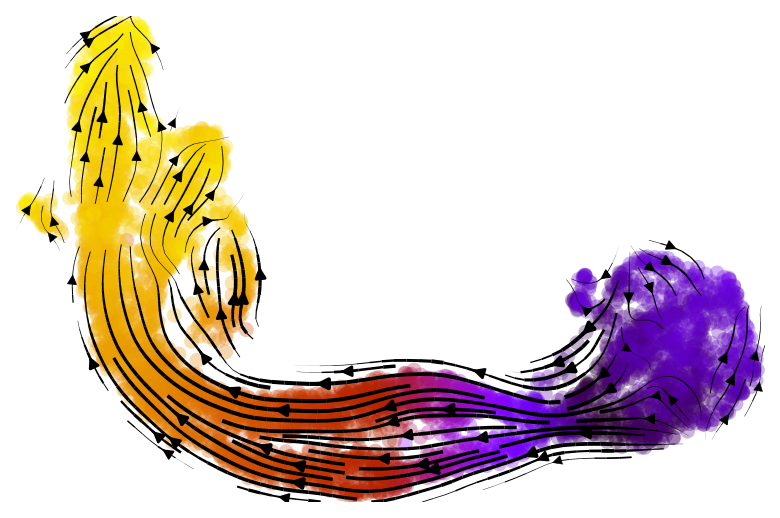

In [59]:
adata_sn.uns["iroot"] = np.flatnonzero(adata_sn.obs["celltype"] == "Ductal")[0]
sc.tl.dpt(adata_sn)

with mplscience.style_context():
    fig, ax = plt.subplots(figsize=(6, 4))
    scv.pl.velocity_embedding_stream(
        adata_sn,
        vkey="velocities_velovi",
        color="dpt_pseudotime",
        color_map="gnuplot",
        ax=ax,
        title="",
        legend_loc=False,
        colorbar=False,
    )
    if SAVE_FIGURES:
        path = FIG_DIR / "uncertainty"
        path.mkdir(parents=True, exist_ok=True)
        fig.savefig(
            path / "pseudtime_umap_velo_stream_sn_dpt.png", format="png", dpi=700, transparent=True, bbox_inches="tight"
        )
        fig.savefig(path / "pseudtime_umap_velo_stream_sn_dpt.svg", format="svg", transparent=True, bbox_inches="tight")

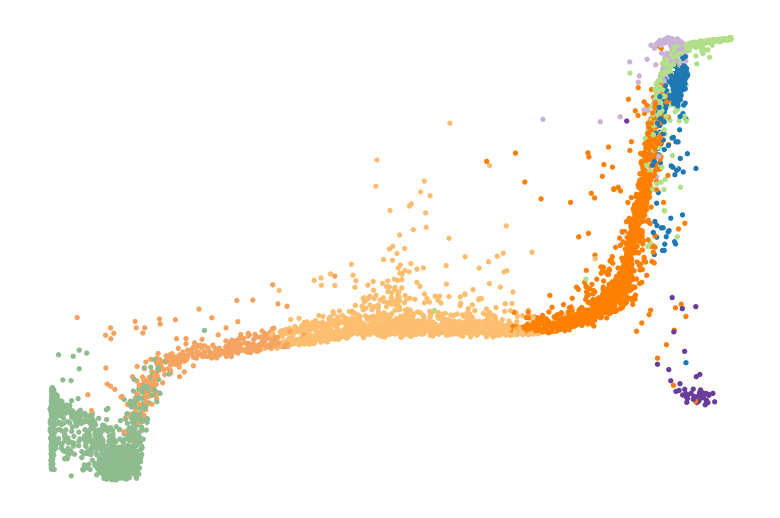

In [60]:
with mplscience.style_context():
    fig, ax = plt.subplots(figsize=(6, 4))
    ax.axis("off")
    scv.pl.scatter(
        adata_sn,
        x=adata_sn.obs["velocities_velovi_pseudotime"],
        y=adata_sn.obs["term_states_fwd_probs"],
        color="celltype",
        ax=ax,
        title="",
        legend_loc=False,
        colorbar=False,
    )

    if SAVE_FIGURES:
        path = FIG_DIR / "uncertainty"
        path.mkdir(parents=True, exist_ok=True)
        fig.savefig(path / "pseudotime_fate_prob_celltype_sn.svg", format="svg", transparent=True, bbox_inches="tight")
        fig.savefig(
            path / "pseudotime_fate_prob_celltype_sn.png", format="png", dpi=700, transparent=True, bbox_inches="tight"
        )

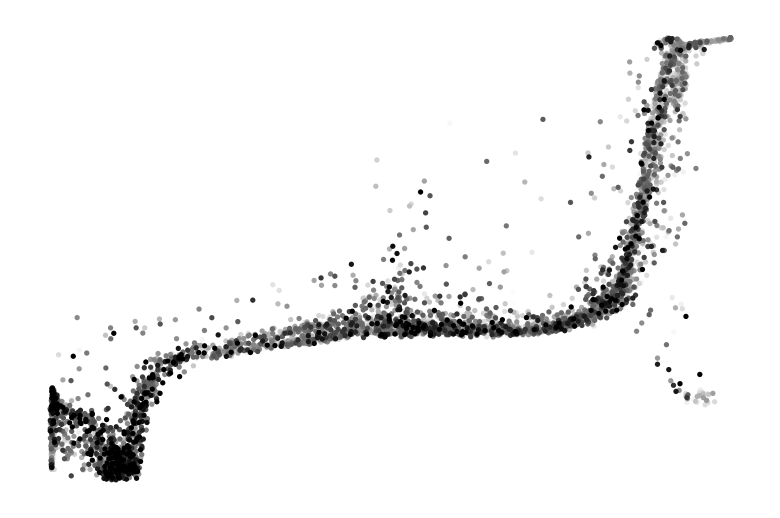

In [61]:
with mplscience.style_context():
    fig, ax = plt.subplots(figsize=(6, 4))
    ax.axis("off")
    scv.pl.scatter(
        adata_sn,
        x=adata_sn.obs["velocities_velovi_pseudotime"],
        y=adata_sn.obs["term_states_fwd_probs"],
        color="directional_cosine_sim_variance",
        perc=[5, 95],
        cmap="Greys",
        ax=ax,
        title="",
        legend_loc=False,
        colorbar=False,
    )

    if SAVE_FIGURES:
        path = FIG_DIR / "uncertainty"
        path.mkdir(parents=True, exist_ok=True)
        fig.savefig(path / "pseudotime_fate_prob_intrinsic_sn.svg", format="svg", transparent=True, bbox_inches="tight")
        fig.savefig(
            path / "pseudotime_fate_prob_intrinsic_sn.png", format="png", dpi=700, transparent=True, bbox_inches="tight"
        )

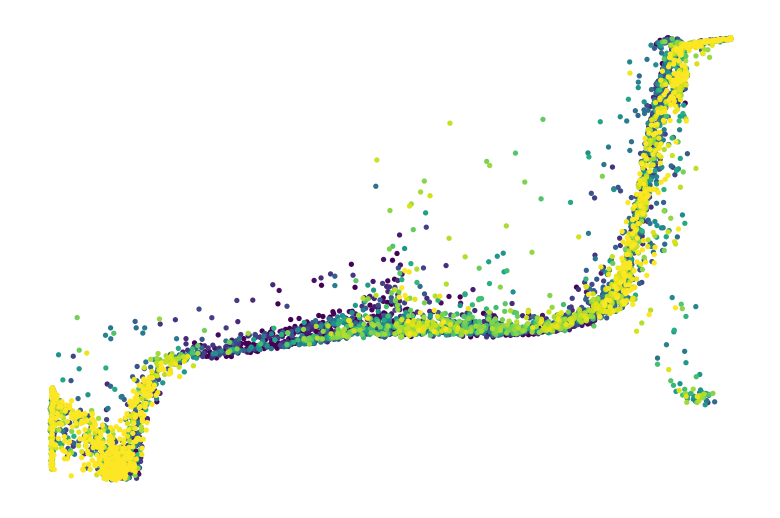

In [62]:
with mplscience.style_context():
    fig, ax = plt.subplots(figsize=(6, 4))
    ax.axis("off")
    scv.pl.scatter(
        adata_sn,
        x=adata_sn.obs["velocities_velovi_pseudotime"],
        y=adata_sn.obs["term_states_fwd_probs"],
        color="directional_cosine_sim_variance_extrinsic",
        perc=[10, 90],
        cmap="viridis",
        ax=ax,
        title="",
        legend_loc=False,
        colorbar=False,
    )

    if SAVE_FIGURES:
        path = FIG_DIR / "uncertainty"
        path.mkdir(parents=True, exist_ok=True)
        fig.savefig(path / "pseudotime_fate_prob_extrinsic_sn.svg", format="svg", transparent=True, bbox_inches="tight")
        fig.savefig(
            path / "pseudotime_fate_prob_extrinsic_sn.png", format="png", dpi=700, transparent=True, bbox_inches="tight"
        )

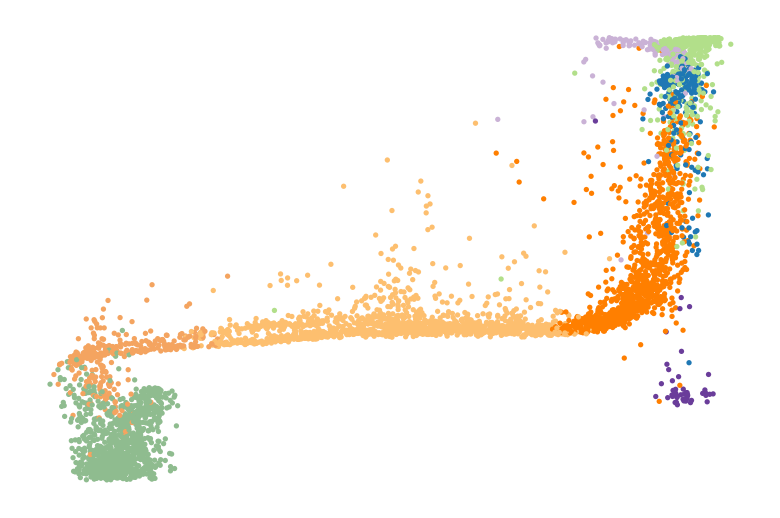

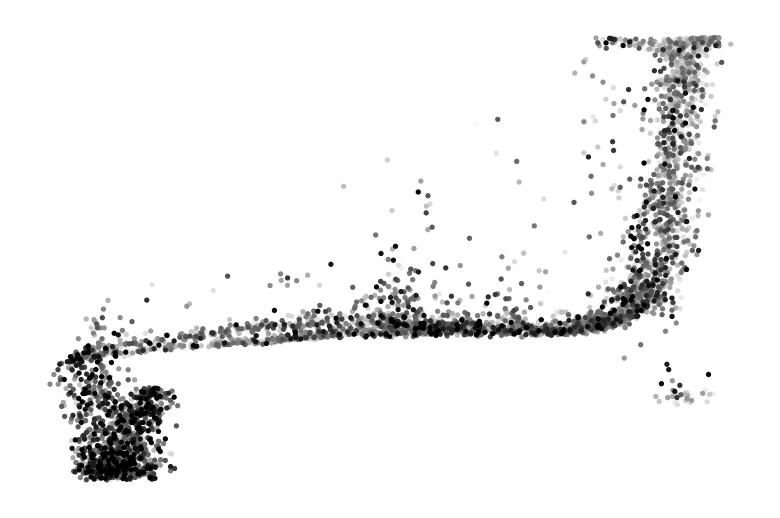

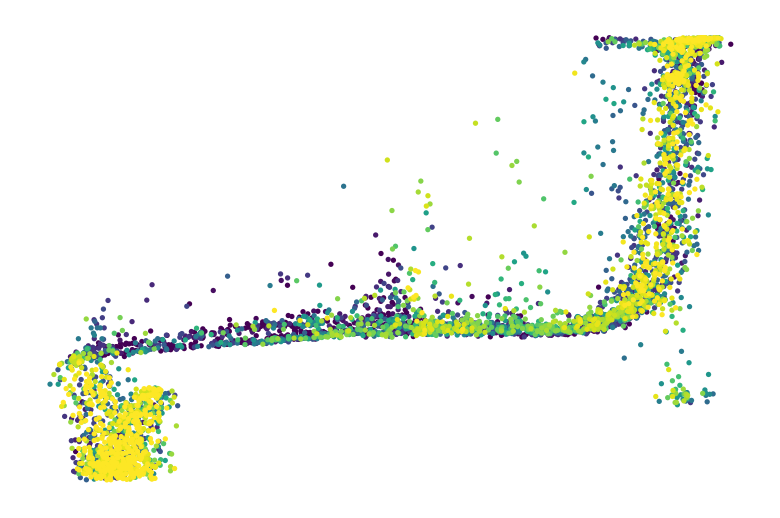

In [63]:
## now for dpt pseudotime
with mplscience.style_context():
    fig, ax = plt.subplots(figsize=(6, 4))
    ax.axis("off")
    scv.pl.scatter(
        adata_sn,
        x=adata_sn.obs["dpt_pseudotime"],
        y=adata_sn.obs["term_states_fwd_probs"],
        color="celltype",
        ax=ax,
        title="",
        legend_loc=False,
        colorbar=False,
    )

    if SAVE_FIGURES:
        path = FIG_DIR / "uncertainty"
        path.mkdir(parents=True, exist_ok=True)
        fig.savefig(
            path / "pseudotime_fate_prob_celltype_sn_dpt.svg", format="svg", transparent=True, bbox_inches="tight"
        )
        fig.savefig(
            path / "pseudotime_fate_prob_celltype_sn_dpt.png",
            format="png",
            dpi=700,
            transparent=True,
            bbox_inches="tight",
        )


with mplscience.style_context():
    fig, ax = plt.subplots(figsize=(6, 4))
    ax.axis("off")
    scv.pl.scatter(
        adata_sn,
        x=adata_sn.obs["dpt_pseudotime"],
        y=adata_sn.obs["term_states_fwd_probs"],
        color="directional_cosine_sim_variance",
        perc=[5, 95],
        cmap="Greys",
        ax=ax,
        title="",
        legend_loc=False,
        colorbar=False,
    )

    if SAVE_FIGURES:
        path = FIG_DIR / "uncertainty"
        path.mkdir(parents=True, exist_ok=True)
        fig.savefig(
            path / "pseudotime_fate_prob_intrinsic_sn_dpt.svg", format="svg", transparent=True, bbox_inches="tight"
        )
        fig.savefig(
            path / "pseudotime_fate_prob_intrinsic_sn_dpt.png",
            format="png",
            dpi=700,
            transparent=True,
            bbox_inches="tight",
        )

with mplscience.style_context():
    fig, ax = plt.subplots(figsize=(6, 4))
    ax.axis("off")
    scv.pl.scatter(
        adata_sn,
        x=adata_sn.obs["dpt_pseudotime"],
        y=adata_sn.obs["term_states_fwd_probs"],
        color="directional_cosine_sim_variance_extrinsic",
        perc=[10, 90],
        cmap="viridis",
        ax=ax,
        title="",
        legend_loc=False,
        colorbar=False,
    )

    if SAVE_FIGURES:
        path = FIG_DIR / "uncertainty"
        path.mkdir(parents=True, exist_ok=True)
        fig.savefig(
            path / "pseudotime_fate_prob_extrinsic_sn_dpt.svg", format="svg", transparent=True, bbox_inches="tight"
        )
        fig.savefig(
            path / "pseudotime_fate_prob_extrinsic_sn_dpt.png",
            format="png",
            dpi=700,
            transparent=True,
            bbox_inches="tight",
        )

## Nuc/Cyt model

In [25]:
# Nuccyt
vk = cr.kernels.VelocityKernel.from_adata(adata, key="T_fwd")

g = cr.estimators.GPCCA(vk)
print(g)

g.fit(cluster_key="celltype", n_states=10)

GPCCA[kernel=VelocityKernel[n=8403], initial_states=None, terminal_states=None]


GPCCA[kernel=VelocityKernel[n=8403], initial_states=None, terminal_states=None]

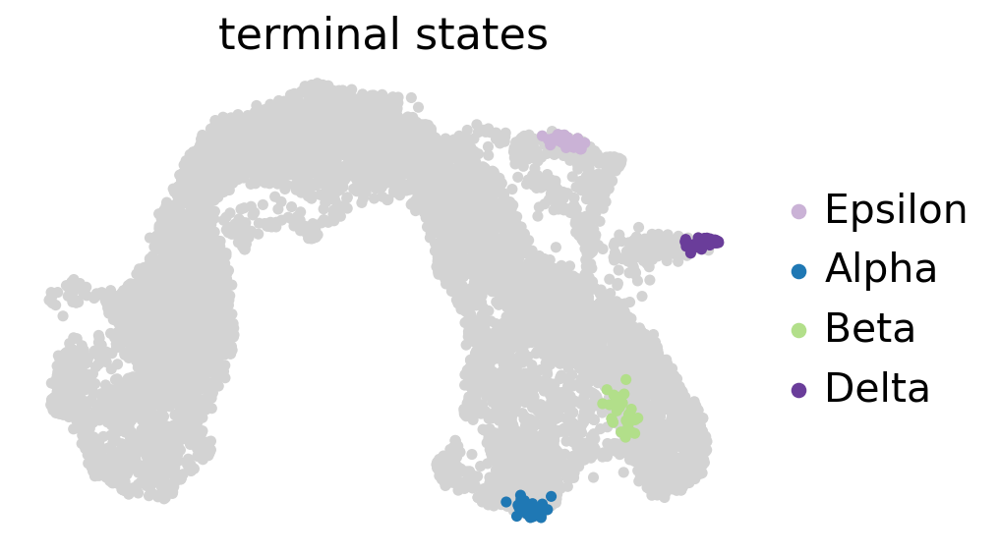

  0%|          | 0/4 [00:00<?, ?/s]

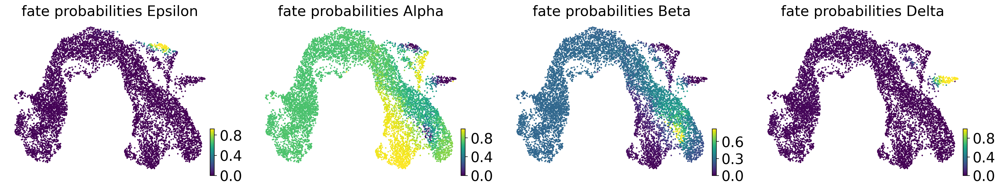

In [41]:
# does not infer epsilon, delta as in tutorial
g.set_terminal_states(states=["Epsilon", "Alpha", "Beta", "Delta"])
g.plot_macrostates(which="terminal", legend_loc="right", size=100)

g.compute_fate_probabilities()
g.plot_fate_probabilities(same_plot=False)

computing velocity embedding
    finished (0:00:01) --> added
    'velocities_velovi_s_sum_umap', embedded velocity vectors (adata.obsm)


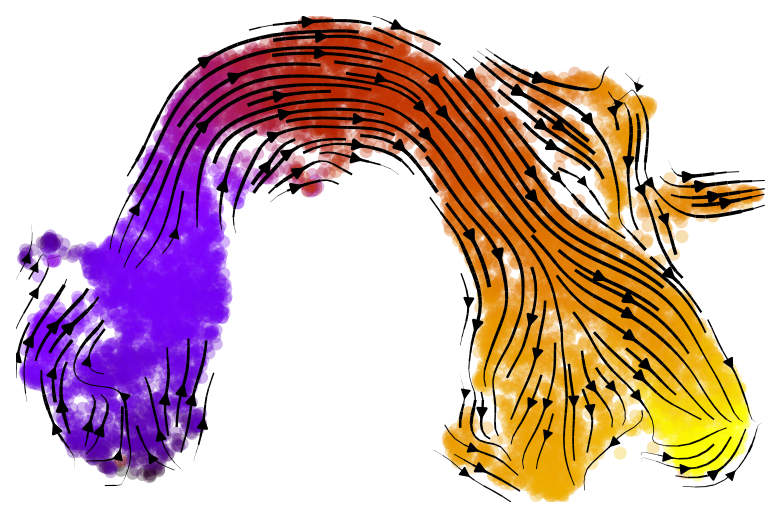

In [31]:
# calculate pseudotime
adata.layers["Ms"] = adata.layers["Ms_sum"]
scv.tl.velocity_pseudotime(adata, vkey="velocities_velovi_s_sum")

with mplscience.style_context():
    fig, ax = plt.subplots(figsize=(6, 4))
    scv.pl.velocity_embedding_stream(
        adata,
        vkey="velocities_velovi_s_sum",
        color="velocities_velovi_s_sum_pseudotime",
        color_map="gnuplot",
        ax=ax,
        title="",
        legend_loc=False,
        colorbar=False,
    )
    if SAVE_FIGURES:
        path = FIG_DIR / "uncertainty"
        path.mkdir(parents=True, exist_ok=True)
        fig.savefig(
            path / "pseudtime_umap_velo_stream_nuccyt_e15.png",
            format="png",
            dpi=700,
            transparent=True,
            bbox_inches="tight",
        )
        fig.savefig(
            path / "pseudtime_umap_velo_stream_nuccyt_e15.svg", format="svg", transparent=True, bbox_inches="tight"
        )

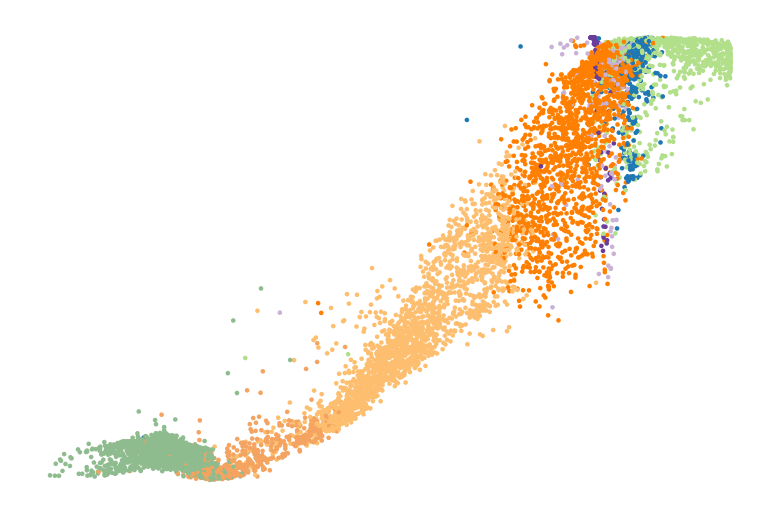

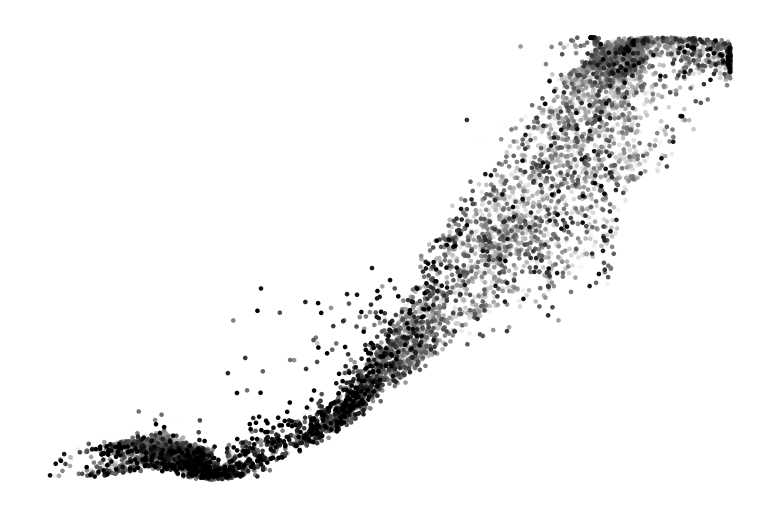

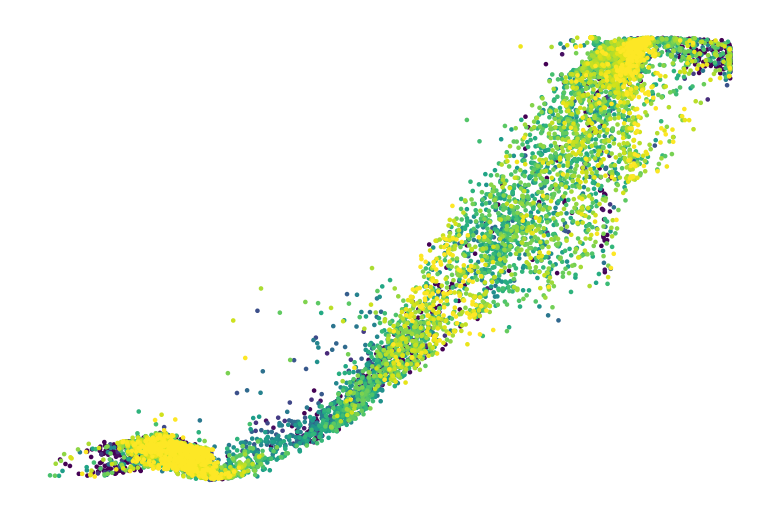

In [43]:
## now for dpt pseudotime
with mplscience.style_context():
    fig, ax = plt.subplots(figsize=(6, 4))
    ax.axis("off")
    scv.pl.scatter(
        adata,
        x=adata.obs["velocities_velovi_s_sum_pseudotime"],
        y=adata.obs["term_states_fwd_probs"],
        color="celltype",
        ax=ax,
        title="",
        legend_loc=False,
        colorbar=False,
    )

    if SAVE_FIGURES:
        path = FIG_DIR / "uncertainty"
        path.mkdir(parents=True, exist_ok=True)
        fig.savefig(
            path / "pseudotime_fate_prob_celltype_nuccyt_e15.svg", format="svg", transparent=True, bbox_inches="tight"
        )
        fig.savefig(
            path / "pseudotime_fate_prob_celltype_nuccyt_e15.png",
            format="png",
            dpi=700,
            transparent=True,
            bbox_inches="tight",
        )


with mplscience.style_context():
    fig, ax = plt.subplots(figsize=(6, 4))
    ax.axis("off")
    scv.pl.scatter(
        adata,
        x=adata.obs["velocities_velovi_s_sum_pseudotime"],
        y=adata.obs["term_states_fwd_probs"],
        color="directional_cosine_sim_variance",
        perc=[5, 95],
        cmap="Greys",
        ax=ax,
        title="",
        legend_loc=False,
        colorbar=False,
    )

    if SAVE_FIGURES:
        path = FIG_DIR / "uncertainty"
        path.mkdir(parents=True, exist_ok=True)
        fig.savefig(
            path / "pseudotime_fate_prob_intrinsic_nuccyt_e15.svg", format="svg", transparent=True, bbox_inches="tight"
        )
        fig.savefig(
            path / "pseudotime_fate_prob_intrinsic_nuccyt_e15.png",
            format="png",
            dpi=700,
            transparent=True,
            bbox_inches="tight",
        )

with mplscience.style_context():
    fig, ax = plt.subplots(figsize=(6, 4))
    ax.axis("off")
    scv.pl.scatter(
        adata,
        x=adata.obs["velocities_velovi_s_sum_pseudotime"],
        y=adata.obs["term_states_fwd_probs"],
        color="directional_cosine_sim_variance_extrinsic",
        perc=[10, 90],
        cmap="viridis",
        ax=ax,
        title="",
        legend_loc=False,
        colorbar=False,
    )

    if SAVE_FIGURES:
        path = FIG_DIR / "uncertainty"
        path.mkdir(parents=True, exist_ok=True)
        fig.savefig(
            path / "pseudotime_fate_prob_extrinsic_nuccyt_e15.svg", format="svg", transparent=True, bbox_inches="tight"
        )
        fig.savefig(
            path / "pseudotime_fate_prob_extrinsic_nuccyt_e15.png",
            format="png",
            dpi=700,
            transparent=True,
            bbox_inches="tight",
        )

## Velocity confidence
Calculate velo confidence of single-cell and nucleus velocities (single-modal models) by embedding into batch-corrected latent space and restrict neighborhood to neighbors of the respective other modality

In [44]:
# get common cell names
sc_cells = list(set(adata_sc.obs_names).intersection(set(adata.obs_names)))
sn_cells = list(set(adata_sn.obs_names).intersection(set(adata.obs_names)))

# find common genes
common_genes = list(set(adata_sc.var_names).intersection(set(adata_sn.var_names)).intersection(set(adata.var_names)))
velos_sn = adata_sn[sn_cells, common_genes].layers["velocities_velovi"]
velos_sc = adata_sc[sc_cells, common_genes].layers["velocities_velovi"]
velos_sn_sc = np.concatenate([velos_sn, velos_sc], axis=0)

adata_sn_sc = adata[sn_cells + sc_cells, common_genes].copy()
adata_sn_sc.layers["velocity_sn_sc"] = velos_sn_sc

vkey = "velocity_sn_sc"
V = np.array(adata_sn_sc.layers[vkey])

tmp_filter = np.invert(np.isnan(np.sum(V, axis=0)))
if f"{vkey}_genes" in adata_sn_sc.var.keys():
    tmp_filter &= np.array(adata_sn_sc.var[f"{vkey}_genes"], dtype=bool)
if "spearmans_score" in adata_sn_sc.var.keys():
    tmp_filter &= adata_sn_sc.var["spearmans_score"].values > 0.1

V = V[:, tmp_filter]

V -= V.mean(1)[:, None]
V_norm = l2_norm(V, axis=1)
R = np.zeros(adata_sn_sc.n_obs)

ad_obs = adata_sn_sc.obs.reset_index()
sc_index = ad_obs[ad_obs.protocol == "scRNA-seq"].index
sn_index = ad_obs[ad_obs.protocol != "scRNA-seq"].index

indices = get_indices(dist=get_neighs(adata_sn_sc, "distances"))[0]
for i in range(adata_sn_sc.n_obs):
    if adata_sn_sc.obs.protocol[i] == "scRNA-seq":
        Vi_neighs = V[list(set(indices[i]).intersection(sn_index))]
        Vi_neighs -= Vi_neighs.mean(1)[:, None]
        R[i] = np.mean(np.einsum("ij, j", Vi_neighs, V[i]) / (l2_norm(Vi_neighs, axis=1) * V_norm[i])[None, :])
    else:
        Vi_neighs = V[list(set(indices[i]).intersection(sc_index))]
        Vi_neighs -= Vi_neighs.mean(1)[:, None]
        R[i] = np.mean(np.einsum("ij, j", Vi_neighs, V[i]) / (l2_norm(Vi_neighs, axis=1) * V_norm[i])[None, :])

adata_sn_sc.obs[f"{vkey}_length"] = V_norm.round(2)
adata_sn_sc.obs[f"{vkey}_confidence"] = np.clip(R, 0, None)

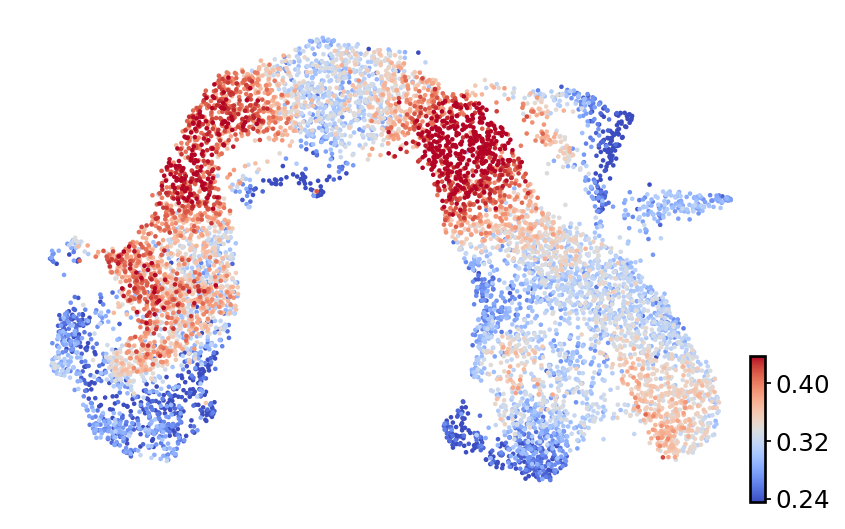

In [45]:
with mplscience.style_context():
    fig, ax = plt.subplots(figsize=(6, 4))
    scv.pl.scatter(adata_sn_sc, c="velocity_sn_sc_confidence", cmap="coolwarm", perc=[5, 95], ax=ax, title="")
    if SAVE_FIGURES:
        path = FIG_DIR / "velo_confidence"
        path.mkdir(parents=True, exist_ok=True)
        fig.savefig(
            path / "velo_confidence_sn_sc_neighbors_e15.svg", format="svg", transparent=True, bbox_inches="tight"
        )

## Single-cell vs. nucleus confidence

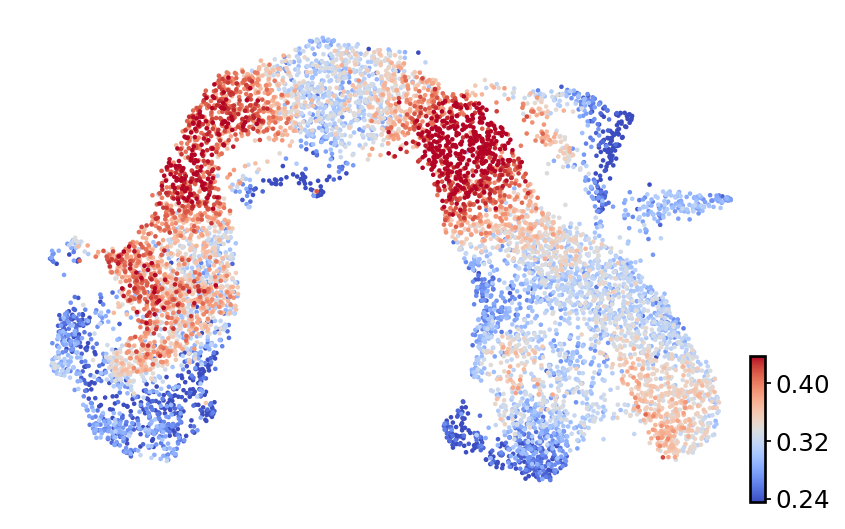

In [46]:
with mplscience.style_context():
    fig, ax = plt.subplots(figsize=(6, 4))
    scv.pl.scatter(adata_sn_sc, c="velocity_sn_sc_confidence", cmap="coolwarm", perc=[5, 95], ax=ax, title="")
    if SAVE_FIGURES:
        path = FIG_DIR / "velo_confidence"
        path.mkdir(parents=True, exist_ok=True)
        fig.savefig(
            path / "velo_confidence_sn_sc_neighbors_e15.svg", format="svg", transparent=True, bbox_inches="tight"
        )

## Now for each model separatley

In [47]:
scv.tl.velocity_confidence(adata_sc, vkey="velocities_velovi")
scv.tl.velocity_confidence(adata_sn, vkey="velocities_velovi")

adata.layers["Ms"] = adata.layers["Ms_nuc"]
scv.tl.velocity_confidence(adata, vkey="velocities_velovi_s_nuc")
adata.layers["Ms"] = adata.layers["Ms_sum"]
scv.tl.velocity_confidence(adata, vkey="velocities_velovi_s_sum")

--> added 'velocities_velovi_length' (adata.obs)
--> added 'velocities_velovi_confidence' (adata.obs)
--> added 'velocities_velovi_confidence_transition' (adata.obs)
--> added 'velocities_velovi_length' (adata.obs)
--> added 'velocities_velovi_confidence' (adata.obs)
--> added 'velocities_velovi_confidence_transition' (adata.obs)
--> added 'velocities_velovi_s_nuc_length' (adata.obs)
--> added 'velocities_velovi_s_nuc_confidence' (adata.obs)
--> added 'velocities_velovi_s_nuc_confidence_transition' (adata.obs)
--> added 'velocities_velovi_s_sum_length' (adata.obs)
--> added 'velocities_velovi_s_sum_confidence' (adata.obs)
--> added 'velocities_velovi_s_sum_confidence_transition' (adata.obs)


## Nucleus cytosol model
s_nuc velo

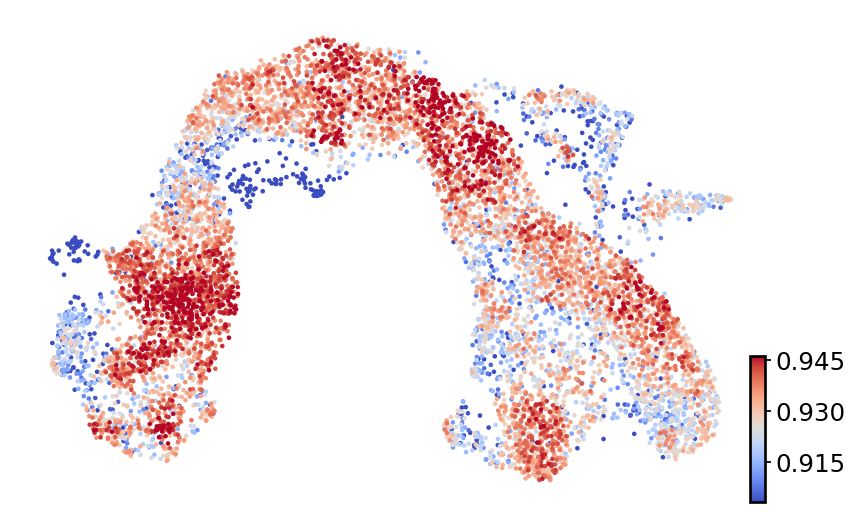

In [48]:
with mplscience.style_context():
    fig, ax = plt.subplots(figsize=(6, 4))
    scv.pl.scatter(adata, c="velocities_velovi_s_nuc_confidence", cmap="coolwarm", perc=[5, 95], ax=ax, title="")
    if SAVE_FIGURES:
        path = FIG_DIR / "velo_confidence"
        path.mkdir(parents=True, exist_ok=True)
        fig.savefig(path / "velo_confidence_nuc_cyt_e15.svg", format="svg", transparent=True, bbox_inches="tight")

S_sum velo

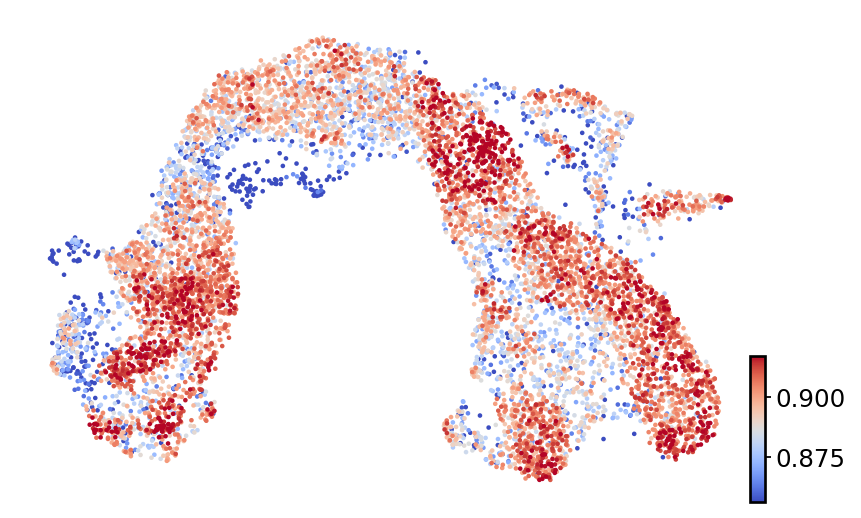

In [49]:
with mplscience.style_context():
    fig, ax = plt.subplots(figsize=(6, 4))
    scv.pl.scatter(adata, c="velocities_velovi_s_sum_confidence", cmap="coolwarm", perc=[5, 95], ax=ax, title="")
    if SAVE_FIGURES:
        path = FIG_DIR / "velo_confidence"
        path.mkdir(parents=True, exist_ok=True)
        fig.savefig(path / "velo_confidence_nuc_cyt_ssum_e15.svg", format="svg", transparent=True, bbox_inches="tight")

## Single-nucleus confidence

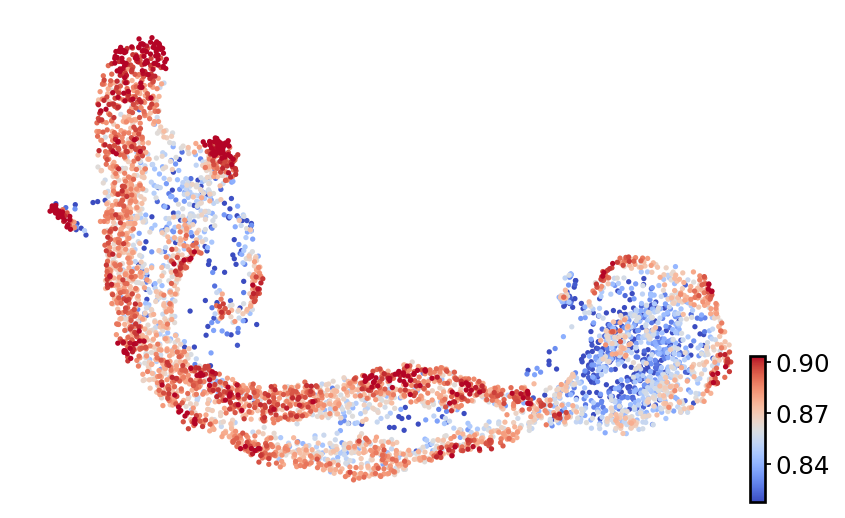

In [50]:
with mplscience.style_context():
    fig, ax = plt.subplots(figsize=(6, 4))
    scv.pl.scatter(adata_sn, c="velocities_velovi_confidence", cmap="coolwarm", perc=[5, 95], ax=ax, title="")
    if SAVE_FIGURES:
        path = FIG_DIR / "velo_confidence"
        path.mkdir(parents=True, exist_ok=True)
        fig.savefig(path / "velo_confidence_sn_e15.svg", format="svg", transparent=True, bbox_inches="tight")

## Single-cell confidence

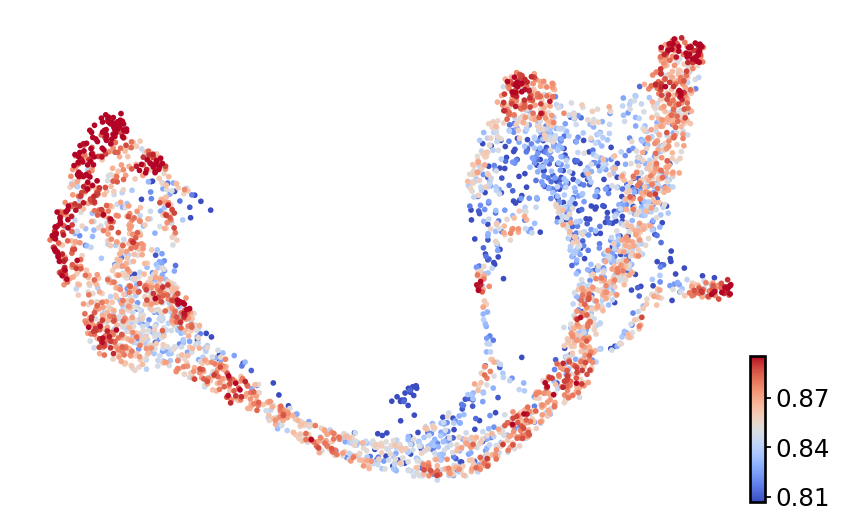

In [51]:
with mplscience.style_context():
    fig, ax = plt.subplots(figsize=(6, 4))
    scv.pl.scatter(adata_sc, c="velocities_velovi_confidence", cmap="coolwarm", perc=[5, 95], ax=ax, title="")
    if SAVE_FIGURES:
        path = FIG_DIR / "velo_confidence"
        path.mkdir(parents=True, exist_ok=True)
        fig.savefig(path / "velo_confidence_sc_e15.svg", format="svg", transparent=True, bbox_inches="tight")

## Plot violin plot of all models and velo confidence distribution

In [52]:
dfs = []


adata.layers["Ms"] = adata.layers["Ms_nuc"]
g_df = compute_confidence(adata, "velocities_velovi_s_nuc")
g_df["Dataset"] = "Pancreas E14.5"
g_df["Method"] = "Nuc/Cyt model (s_nuc velo)"
dfs.append(g_df)

adata.layers["Ms"] = adata.layers["Ms_cyt"]
g_df = compute_confidence(adata, "velocities_velovi_s_cyt")
g_df["Dataset"] = "Pancreas E14.5"
g_df["Method"] = "Nuc/Cyt model (s_cyt velo)"
dfs.append(g_df)

adata.layers["Ms"] = adata.layers["Ms_sum"]
g_df = compute_confidence(adata, "velocities_velovi_s_sum")
g_df["Dataset"] = "Pancreas E14.5"
g_df["Method"] = "Nuc/Cyt model (s_sum velo)"
dfs.append(g_df)

g_df = compute_confidence(adata_sc)
g_df["Dataset"] = "Pancreas E14.5"
g_df["Method"] = "sc-model"
dfs.append(g_df)

g_df = compute_confidence(adata_sn)
g_df["Dataset"] = "Pancreas E14.5"
g_df["Method"] = "sn-model"
dfs.append(g_df)

g_df = pd.DataFrame()
g_df["Velocity confidence"] = adata_sn_sc.obs["velocity_sn_sc_confidence"].to_numpy().ravel()
g_df["Dataset"] = "Pancreas E14.5"
g_df["Method"] = "Nuc/Cyt model sc neighbors vs sn neigbors"
dfs.append(g_df)


conf_df = pd.concat(dfs, axis=0)

--> added 'velocities_velovi_s_nuc_length' (adata.obs)
--> added 'velocities_velovi_s_nuc_confidence' (adata.obs)
--> added 'velocities_velovi_s_cyt_length' (adata.obs)
--> added 'velocities_velovi_s_cyt_confidence' (adata.obs)
--> added 'velocities_velovi_s_cyt_confidence_transition' (adata.obs)
--> added 'velocities_velovi_s_sum_length' (adata.obs)
--> added 'velocities_velovi_s_sum_confidence' (adata.obs)
--> added 'velocities_velovi_length' (adata.obs)
--> added 'velocities_velovi_confidence' (adata.obs)
--> added 'velocities_velovi_length' (adata.obs)
--> added 'velocities_velovi_confidence' (adata.obs)


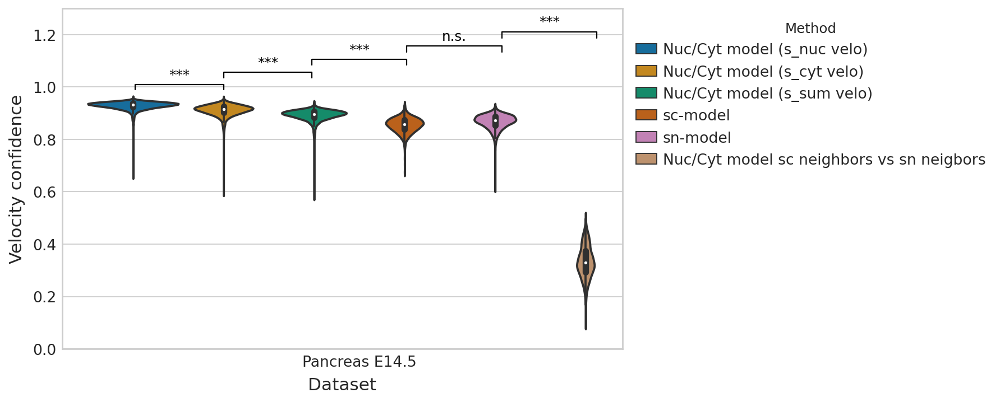

In [55]:
with mplscience.style_context():
    sns.set_style(style="whitegrid")
    fig, ax = plt.subplots(figsize=(8, 5))
    sns.violinplot(
        data=conf_df,
        ax=ax,
        orient="v",
        x="Dataset",
        y="Velocity confidence",
        hue="Method",
        palette=sns.color_palette("colorblind").as_hex()[:6],
    )
    sns.move_legend(ax, "upper left", bbox_to_anchor=(1, 1))
    # compare snuc to scyt for sn
    ttest_res = ttest_ind(
        conf_df.loc[(conf_df.Method == "Nuc/Cyt model (s_nuc velo)"), "Velocity confidence"].values,
        conf_df.loc[(conf_df.Method == "Nuc/Cyt model (s_cyt velo)"), "Velocity confidence"].values,
        equal_var=False,
        alternative="greater",
    )
    significance = _get_significance(ttest_res.pvalue)
    _add_significance(
        ax=ax,
        left=-0.33,
        right=-0.2,
        significance=significance,
        lw=1,
        bracket_level=1,
        c="k",
        level=0,
    )
    # compare scyt ssum
    ttest_res = ttest_ind(
        conf_df.loc[(conf_df.Method == "Nuc/Cyt model (s_cyt velo)"), "Velocity confidence"].values,
        conf_df.loc[(conf_df.Method == "Nuc/Cyt model (s_sum velo)"), "Velocity confidence"].values,
        equal_var=False,
        alternative="greater",
    )
    significance = _get_significance(ttest_res.pvalue)
    _add_significance(
        ax=ax,
        left=-0.2,
        right=-0.07,
        significance=significance,
        lw=1,
        bracket_level=1,
        c="k",
        level=0,
    )
    # compare ssum sc
    ttest_res = ttest_ind(
        conf_df.loc[(conf_df.Method == "Nuc/Cyt model (s_sum velo)"), "Velocity confidence"].values,
        conf_df.loc[(conf_df.Method == "sc-model"), "Velocity confidence"].values,
        equal_var=False,
        alternative="greater",
    )
    significance = _get_significance(ttest_res.pvalue)
    _add_significance(
        ax=ax,
        left=-0.07,
        right=0.07,
        significance=significance,
        lw=1,
        bracket_level=1,
        c="k",
        level=0,
    )
    # compare sn sc
    ttest_res = ttest_ind(
        conf_df.loc[(conf_df.Method == "sc-model"), "Velocity confidence"].values,
        conf_df.loc[(conf_df.Method == "sn-model"), "Velocity confidence"].values,
        equal_var=False,
        alternative="greater",
    )
    significance = _get_significance(ttest_res.pvalue)
    _add_significance(
        ax=ax,
        left=0.07,
        right=0.21,
        significance=significance,
        lw=1,
        bracket_level=1,
        c="k",
        level=0,
    )

    # compare sn to restricted
    ttest_res = ttest_ind(
        conf_df.loc[(conf_df.Method == "sn-model"), "Velocity confidence"].values,
        conf_df.loc[(conf_df.Method == "Nuc/Cyt model sc neighbors vs sn neigbors"), "Velocity confidence"].values,
        equal_var=False,
        alternative="greater",
    )
    significance = _get_significance(ttest_res.pvalue)
    _add_significance(
        ax=ax,
        left=0.21,
        right=0.35,
        significance=significance,
        lw=1,
        bracket_level=1,
        c="k",
        level=0,
    )
    ax.set_ylim([0, 1.3])
    plt.show()
    if SAVE_FIGURES:
        path = FIG_DIR / "velo_confidence"
        path.mkdir(parents=True, exist_ok=True)
        fig.savefig(path / "velo_confidence_all_violin_e15.svg", format="svg", transparent=True, bbox_inches="tight")